In [ ]:
# READ ME
# In code have both LSTM and RNN cells. So, comment the code for LSTM if want to run RNN or vice versa
# For LSTM, only modeling of the TCL system was done. Hence dont run EKF part of the code when using LSTM model

In [50]:
!pip install torch==1.7.0

In [152]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error as MSE

import matplotlib.pyplot as plt
import math as mt

In [153]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

torch.set_printoptions(precision=12)
print(torch.__version__)

1.7.0


In [154]:
series1 = pd.read_csv('/content/Input.csv')
temp = pd.read_csv('/content/Output.csv')

temp = np.asarray(temp)
series1 = np.asarray(series1)

print('Length of the total dataset:',len(series1[:10000]))

series = series1[:9000]
series_test = series1[9000:10000]
series_temp = temp[:9000]
series_test_temp = temp[9000:10000]



# ######################## EXTRA FILES ADDING FOR ESTIMATOR #######################

plant_measurement = pd.read_csv('/content/Experimental_Data_Yk 2.csv')
states_with_noise = pd.read_csv('/content/Output_EKF.csv')
Input_EKF = pd.read_csv('/content/Input_EKF.csv')


#### Data for T2 as measurement ####
Input_EKF_temp2as_measurement = pd.read_csv('/content/Input_EKF_T2_measurement.csv')
states_with_noise_temp2as_measurement = pd.read_csv('/content/State_estimtion_2nd measured_Xe.csv')
######

plant_measurement = np.array(plant_measurement)
states_with_noise = np.array(states_with_noise)
Input_EKF = np.array(Input_EKF)
Input_EKF_temp2as_measurement = np.array(Input_EKF_temp2as_measurement)
states_with_noise_temp2as_measurement = np.array(states_with_noise_temp2as_measurement)

Input_EKF_temp2as_measurement[:,2] = Input_EKF_temp2as_measurement[:,2] + 273.15
Input_EKF_temp2as_measurement[:,3] = Input_EKF_temp2as_measurement[:,3] + 273.15

states_with_noise_temp2as_measurement[:,0] = states_with_noise_temp2as_measurement[:,0] + 273.15
states_with_noise_temp2as_measurement[:,1] = states_with_noise_temp2as_measurement[:,1] + 273.15


Input_EKF[:,2] = Input_EKF[:,2] + 273.15
Input_EKF[:,3] = Input_EKF[:,3] + 273.15

states_with_noise[:,0] = states_with_noise[:,0] + 273.15
states_with_noise[:,1] = states_with_noise[:,1] + 273.15

plant_measurement[:,0] = plant_measurement[:,0] + 273.15
plant_measurement[:,1] = plant_measurement[:,1] + 273.15


# ######################## EXTRA FILES ADDING FOR Step response #######################

Input_step = pd.read_csv('/content/Data_Uk.csv')
output_step = pd.read_csv('/content/Data_Xk.csv')

Input_step = np.asarray(Input_step)
output_step = np.asarray(output_step)


Input_step_plot = Input_step.copy()


Length of the total dataset: 10000


(14000, 2)


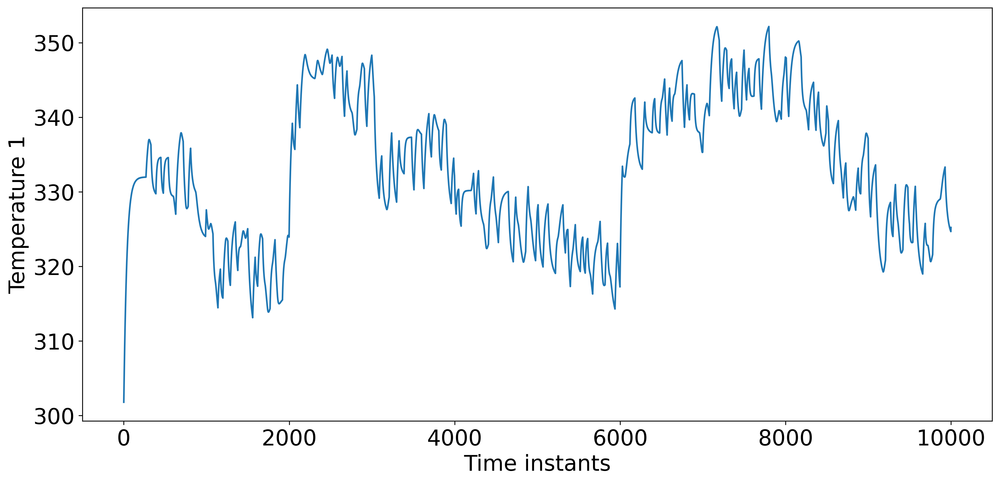

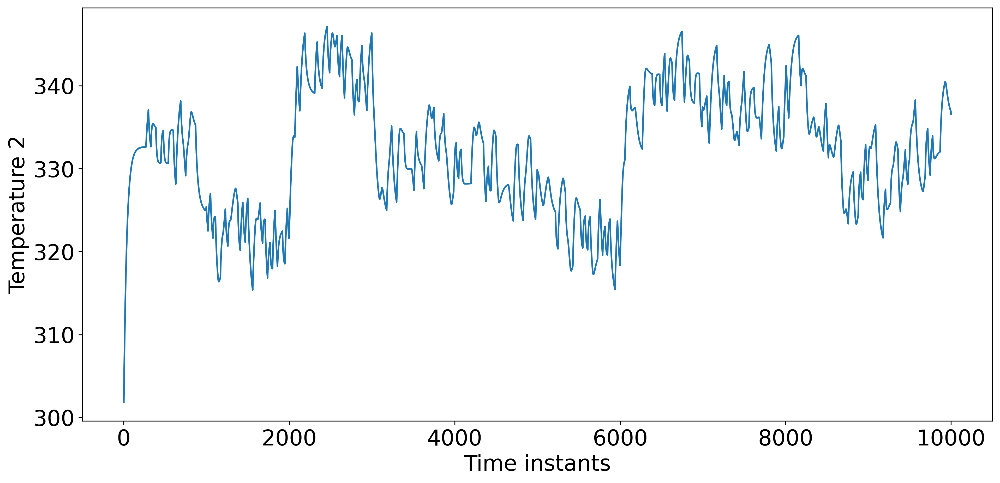

In [155]:
plt.figure(figsize=(15,7))

plt.plot(temp[:10000,0])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Time instants',fontsize=20)
plt.ylabel('Temperature 1',fontsize=20)

plt.figure(figsize=(15,7))

plt.plot(temp[:10000,1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Time instants',fontsize=20)
plt.ylabel('Temperature 2',fontsize=20)

print(temp.shape)

In [156]:
## Generating mean and variance of process noise states

mean_output1_EKF = states_with_noise[:,0].mean()
mean_output2_EKF = states_with_noise[:,1].mean()

std_output1_EKF = states_with_noise[:,0].std()
std_output2_EKF = states_with_noise[:,1].std()

print(mean_output1_EKF)
print(mean_output2_EKF)
print(std_output1_EKF)
print(std_output2_EKF)

330.1350289103039
329.51853595255744
11.076401440056436
9.343083839025462


Text(0.5, 1.0, 'Manipulated Input2 vs time instant')

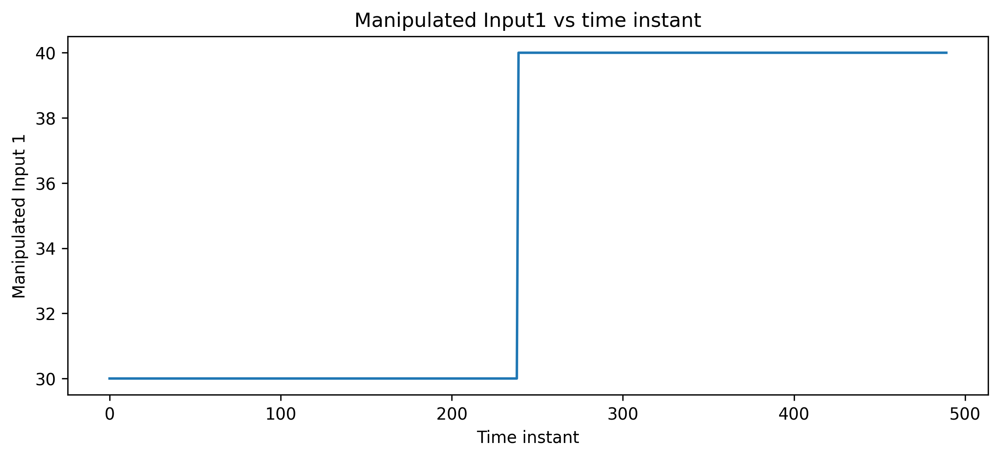

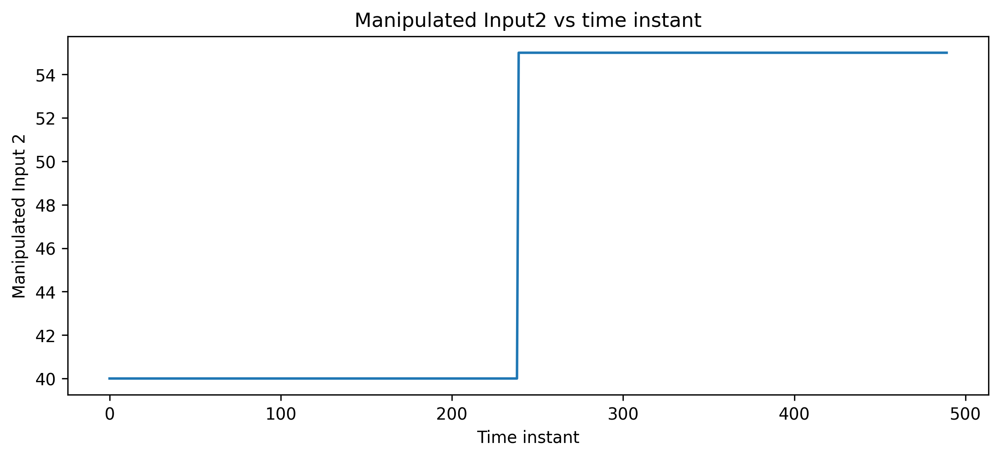

In [56]:
plt.figure(figsize=(10,4))
plt.plot(Input_step[10:,0])
plt.ylabel('Manipulated Input 1')
plt.xlabel('Time instant')
plt.title('Manipulated Input1 vs time instant')

plt.figure(figsize=(10,4))
plt.plot(Input_step[10:,1])
plt.ylabel('Manipulated Input 2')
plt.xlabel('Time instant')
plt.title('Manipulated Input2 vs time instant')

Text(0.5, 1.0, 'MANIPULATED INPUT 1')

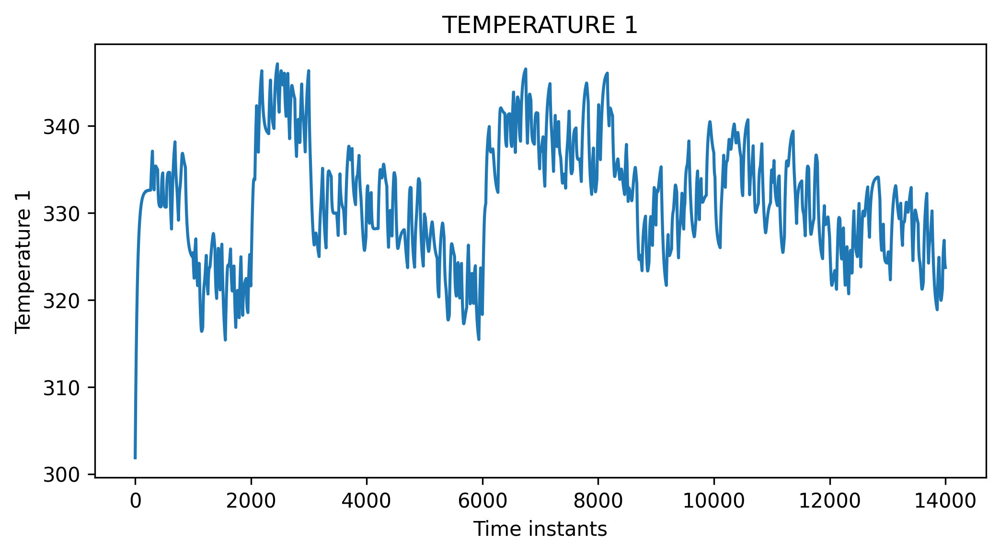

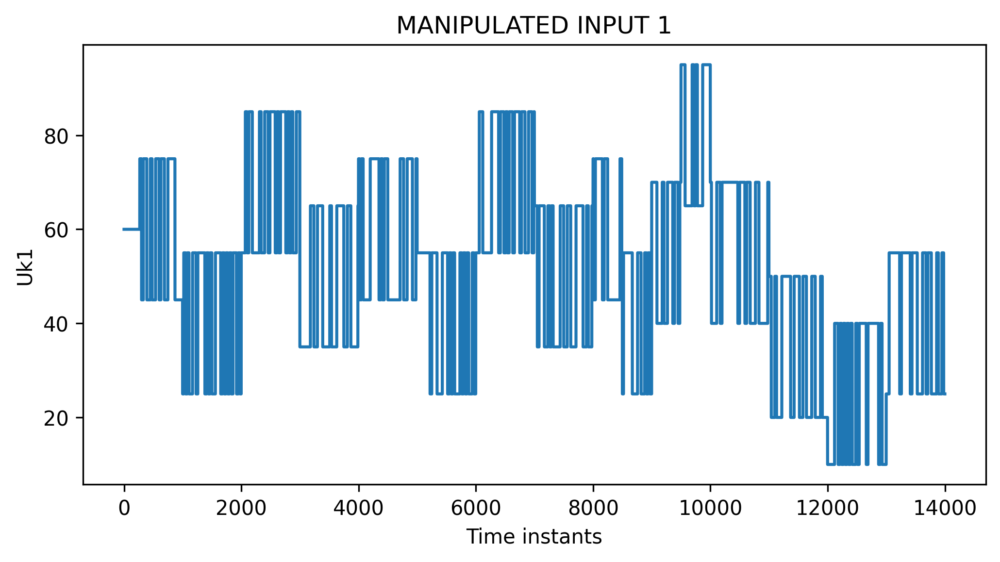

In [57]:


plt.figure(figsize=(8,4),)
# plt.subplot(2,1,1)
plt.plot(temp[:,1])
plt.xlabel('Time instants')
plt.ylabel('Temperature 1')
plt.title('TEMPERATURE 1')


# plt.subplot(2,1,2)
plt.figure(figsize=(8,4),)
plt.plot(series1[:,1])
plt.xlabel('Time instants')
plt.ylabel('Uk1')
plt.title('MANIPULATED INPUT 1')


# ax[0].plot(temp[:,0])
# plt.xlabel('Time instants')
# plt.ylabel('Temperature 1')
# plt.title('TEMPERATURE 1')


# ax[1].plot(series1[:,0])
# plt.xlabel('Time instants')
# plt.ylabel('Temperature 2')
# plt.title('MANIPULATED INPUT 1')

# fig.tight_layout(pad=3.0)

## Normalizing data, only run once

In [157]:


# INPUT
scaler = preprocessing.StandardScaler()
# normalizing series (TRAIN,validation,test)################
mean_input1 = series[:8000,0].mean()
std_input1 = series[:8000,0].std()

mean_input2 = series[:8000,1].mean()
std_input2 = series[:8000,1].std()

mean_input3 = series[:8000,2].mean()
std_input3 = series[:8000,2].std()

mean_input4 = series[:8000,3].mean()
std_input4 = series[:8000,3].std()



#Output meand & std
mean_output1 = series_temp[:8000,0].mean()
std_output1 = series_temp[:8000,0].std()

mean_output2 = series_temp[:8000,1].mean()
std_output2 = series_temp[:8000,1].std()





series[:8000,0] = scaler.fit_transform(series[:8000,0].reshape(-1,1)).reshape(-1)
series[8000:,0] = scaler.transform(series[8000:,0].reshape(-1,1)).reshape(-1)     #for validation for same column
series_test[:,0] = scaler.transform(series_test[:,0].reshape(-1,1)).reshape(-1)     # for test for same column
Input_step[:,0] = scaler.transform(Input_step[:,0].reshape(-1,1)).reshape(-1)
# Input_EKF[:,0] = scaler.transform(Input_EKF[:,0].reshape(-1,1)).reshape(-1)
Input_EKF[:,0] = ((Input_EKF[:,0] - Input_EKF[:,0].mean()) / Input_EKF[:,0].std()).reshape(-1)
Input_EKF_temp2as_measurement[:,0] = ((Input_EKF_temp2as_measurement[:,0] - Input_EKF_temp2as_measurement[:,0].mean()) / Input_EKF_temp2as_measurement[:,0].std()).reshape(-1)

series[:8000,1] = scaler.fit_transform(series[:8000,1].reshape(-1,1)).reshape(-1)
series[8000:,1] = scaler.transform(series[8000:,1].reshape(-1,1)).reshape(-1)
series_test[:,1] = scaler.transform(series_test[:,1].reshape(-1,1)).reshape(-1)
Input_step[:,1] = scaler.transform(Input_step[:,1].reshape(-1,1)).reshape(-1)
# Input_EKF[:,1] = scaler.transform(Input_EKF[:,1].reshape(-1,1)).reshape(-1)
Input_EKF[:,1] = ((Input_EKF[:,1] - Input_EKF[:,1].mean()) / Input_EKF[:,1].std()).reshape(-1)
Input_EKF_temp2as_measurement[:,1] = ((Input_EKF_temp2as_measurement[:,1] - Input_EKF_temp2as_measurement[:,1].mean()) / Input_EKF_temp2as_measurement[:,1].std()).reshape(-1)



series[:8000,2] = scaler.fit_transform(series[:8000,2].reshape(-1,1)).reshape(-1)
series[8000:,2] = scaler.transform(series[8000:,2].reshape(-1,1)).reshape(-1)
series_test[:,2] = scaler.transform(series_test[:,2].reshape(-1,1)).reshape(-1)
Input_step[:,2] = scaler.transform(Input_step[:,2].reshape(-1,1)).reshape(-1)
# Input_EKF[:,2] = scaler.transform(Input_EKF[:,2].reshape(-1,1)).reshape(-1)
Input_EKF[:,2] = ((Input_EKF[:,2] - Input_EKF[:,2].mean()) / Input_EKF[:,2].std()).reshape(-1)
Input_EKF_temp2as_measurement[:,2] = ((Input_EKF_temp2as_measurement[:,2] - Input_EKF_temp2as_measurement[:,2].mean()) / Input_EKF_temp2as_measurement[:,2].std()).reshape(-1)



series[:8000,3] = scaler.fit_transform(series[:8000,3].reshape(-1,1)).reshape(-1)
series[8000:,3] = scaler.transform(series[8000:,3].reshape(-1,1)).reshape(-1)
series_test[:,3] = scaler.transform(series_test[:,3].reshape(-1,1)).reshape(-1)
Input_step[:,3] = scaler.transform(Input_step[:,3].reshape(-1,1)).reshape(-1)
# Input_EKF[:,3] = scaler.transform(Input_EKF[:,3].reshape(-1,1)).reshape(-1)
Input_EKF[:,3] = ((Input_EKF[:,3] - Input_EKF[:,3].mean()) / Input_EKF[:,3].std()).reshape(-1)
Input_EKF_temp2as_measurement[:,3] = ((Input_EKF_temp2as_measurement[:,3] - Input_EKF_temp2as_measurement[:,3].mean()) / Input_EKF_temp2as_measurement[:,3].std()).reshape(-1)







# OUTPUT

# normalizing series (TRAIN,validation,test)################

series_temp[:8000,0] = scaler.fit_transform(series_temp[:8000,0].reshape(-1,1)).reshape(-1)
series_temp[8000:,0] = scaler.transform(series_temp[8000:,0].reshape(-1,1)).reshape(-1)       #for validation of same column
series_test_temp[:,0] = scaler.transform(series_test_temp[:,0].reshape(-1,1)).reshape(-1)       # for validation of same column
output_step[:,0] = scaler.transform(output_step[:,0].reshape(-1,1)).reshape(-1) 


series_temp[:8000,1] = scaler.fit_transform(series_temp[:8000,1].reshape(-1,1)).reshape(-1)
series_temp[8000:,1] = scaler.transform(series_temp[8000:,1].reshape(-1,1)).reshape(-1)
series_test_temp[:,1] = scaler.transform(series_test_temp[:,1].reshape(-1,1)).reshape(-1)
output_step[:,1] = scaler.transform(output_step[:,1].reshape(-1,1)).reshape(-1)




In [158]:
print('Mean of input 1:',mean_input1)
print('Std of input 1:',std_input1)

print('\nMean of input 2:',mean_input2)
print('Std of input 2:',std_input2)

print('\nMean of input 3:',mean_input3)
print('Std of input 3:',std_input3)

print('\nMean of input 4:',mean_input4)
print('Std of input 4:',std_input4)

print('\nMean of output 1:',mean_output1)
print('Std of output 1:',std_output1)

print('\nMean of output 2:',mean_output2)
print('Std of output 2:',std_output2)

Mean of input 1: 44.904625
Std of input 1: 21.700939578953143

Mean of input 2: 55.095625
Std of input 2: 18.327069620083154

Mean of input 3: 332.88221625
Std of input 3: 9.794708372419056

Mean of input 4: 331.9686
Std of input 4: 7.639581154422015

Mean of output 1: 332.88809499999996
Std of output 1: 9.78968334503088

Mean of output 2: 331.9735225
Std of output 2: 7.6323088359285975


In [159]:
print(std_input3/std_output1)

1.0005132982560387


##Visualization

Text(0, 0.5, 'Uk2')

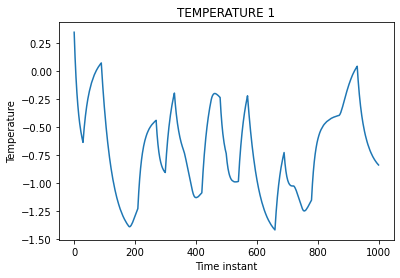

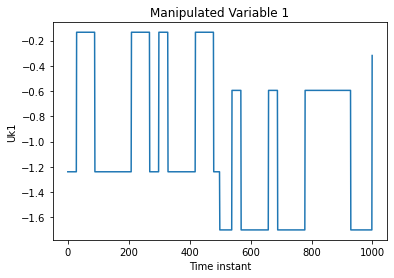

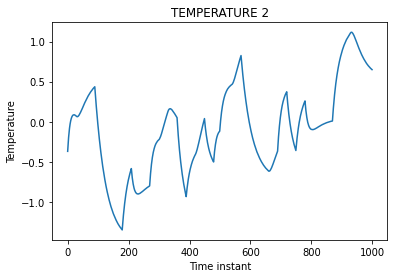

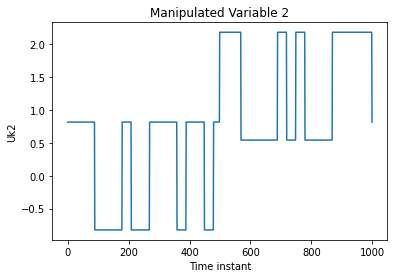

In [ ]:
plt.figure()
# plt.subplot(1,2,1)
plt.plot(series_test[:,2])
plt.title('TEMPERATURE 1')
plt.xlabel('Time instant')
plt.ylabel('Temperature')

# plt.subplot(1,2,2)
plt.figure()
plt.plot(series_test[:,0])
plt.title('Manipulated Variable 1')
plt.xlabel('Time instant')
plt.ylabel('Uk1')


plt.figure()
# plt.subplot(1,2,1)
plt.plot(series_test[:,3])
plt.title('TEMPERATURE 2')
plt.xlabel('Time instant')
plt.ylabel('Temperature')

# plt.subplot(1,2,2)
plt.figure()
plt.plot(series_test[:,1])
plt.title('Manipulated Variable 2')
plt.xlabel('Time instant')
plt.ylabel('Uk2')


## Dataloader

In [160]:
def Dataloader(seriesss,target,T,n_input,n_output):
     
     data4 = []
     output = []

     for i in range(len(seriesss)-T):
         x = seriesss[i:i+T]
         data4.append(x)

         y = target[i+T-1]
         output.append(y)

     data4 = np.asarray(data4)
     output = np.asarray(output)

     data4 = data4.reshape(-1,T,n_input)
     output = output.reshape(-1,n_output)# change when output length changes


     return data4,output

In [161]:
T=10
n_input=4           ##CHANGE AFTER CHANGING THE SYSTEM
n_output=2          ##CHANGE AFTER CHANGING THE SYSTEM
data,target = Dataloader(series,series_temp,T,n_input,n_output)

In [162]:
print(target.shape)

(8990, 2)


##Modelling

In [163]:
# Set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


### Model making (check activation)

#### Run for LSTM

In [165]:
class SimpleRNN(nn.Module):
    def __init__(self,n_input, n_hidden, n_rnnlayers, n_outputs):
        super(SimpleRNN, self).__init__()

        torch.manual_seed(1)
        self.D = n_input
        self.M = n_hidden
        self.K = n_outputs
        #self.O = 3 
        self.L = n_rnnlayers

        # note batch_first = True
        # applies the convention that out data will be shape:
        # (num_samples, sequence length, num_features)
        # rather than :
        # (sequence_length, num_samples, num_features )

        self.rnn = nn.LSTM(
            input_size = self.D,
            hidden_size = self.M,
            num_layers = self.L,
            batch_first = True,
            #dropout = 0.001
        )
        

#########################################################
        self.fc = nn.Linear(self.M,self.K)
#########################################################

        # self.fc = nn.Linear(self.M,self.O)
        # self.final = nn.Linear(self.O,self.K)

    def forward(self,data):
        # initial hidden states

        h0 = torch.zeros(self.L,data.size(0),self.M).to(device)
        c0 = torch.zeros(self.L,data.size(0),self.M).to(device)

        # get RNN unit output
        # out is of size (N,T,M)
        # 2nd return value is hidden states at each hidden layer
        # we don't need those right now 

        #######################out,_ = self.rnn(data,h0)

        out_h2, out_h1 = self.rnn(data,(h0,c0)) # new adjustment




        # we only want h(T) at the final time step
        # N x M --> N x K

        #######################out = self.fc(out[:,-1,:])
        out = self.fc(out_h2[:,-1,:])    #new adjustment
        return out,out_h1

In [166]:
# # Instantiate the model
# model = SimpleRNN(n_input = 4, n_hidden = 10, n_rnnlayers = 2, n_outputs = 2) #changed to 2 when both state estimated
# model.to(device)

#### Run for RNN

In [69]:
class SimpleRNN(nn.Module):
    def __init__(self,n_input, n_hidden, n_rnnlayers, n_outputs):
        super(SimpleRNN, self).__init__()

        torch.manual_seed(1)
        self.D = n_input
        self.M = n_hidden
        self.K = n_outputs
        #self.O = 3 
        self.L = n_rnnlayers

        # note batch_first = True
        # applies the convention that out data will be shape:
        # (num_samples, sequence length, num_features)
        # rather than :
        # (sequence_length, num_samples, num_features )

        self.rnn = nn.RNN(
            input_size = self.D,
            hidden_size = self.M,
            num_layers = self.L,
            nonlinearity = 'tanh',
            batch_first = True,
            #dropout = 0.001
        )
        

#########################################################
        self.fc = nn.Linear(self.M,self.K)
#########################################################

        # self.fc = nn.Linear(self.M,self.O)
        # self.final = nn.Linear(self.O,self.K)

    def forward(self,data):
        # initial hidden states

        h0 = torch.zeros(self.L,data.size(0),self.M).to(device)

        # get RNN unit output
        # out is of size (N,T,M)
        # 2nd return value is hidden states at each hidden layer
        # we don't need those right now 

        #######################out,_ = self.rnn(data,h0)

        out_h2, out_h1 = self.rnn(data,h0) # new adjustment




        # we only want h(T) at the final time step
        # N x M --> N x K

        #######################out = self.fc(out[:,-1,:])
        out = self.fc(out_h2[:,-1,:])    #new adjustment
        return out,out_h1

In [70]:
# Instantiate the model
model = SimpleRNN(n_input = 4, n_hidden = 10, n_rnnlayers = 2, n_outputs = 2) #changed to 2 when both state estimated
model.to(device)

SimpleRNN(
  (rnn): RNN(4, 10, num_layers=2, batch_first=True)
  (fc): Linear(in_features=10, out_features=2, bias=True)
)

## Load model

### Tanh LSTM model

In [167]:
# #Before using this run Simple RNN cell

# #loading entire model
# model = torch.load('TCL_LSTMmodel_with_Truestates_TANH2_25k.pth')
# model

SimpleRNN(
  (rnn): LSTM(4, 10, num_layers=2, batch_first=True)
  (fc): Linear(in_features=10, out_features=2, bias=True)
)

### TAnh model

In [72]:
#Before using this run Simple RNN cell

#loading entire model
model = torch.load('TCL_model_with_Truestates_TANH2_25k.pth')
model

SimpleRNN(
  (rnn): RNN(4, 10, num_layers=2, batch_first=True)
  (fc): Linear(in_features=10, out_features=2, bias=True)
)

## Skip Loss and optimizer

In [ ]:
# Loss and Optimizer

criterion = nn.MSELoss()
# opt = torch.optim.Adam(model.parameters() , lr = 0.0001)

opt = torch.optim.Adam(model.parameters() , lr = 0.0001)    # checking 

## Splitting into Train and Validation

In [168]:
x_train = torch.from_numpy(data[:8000].astype(np.float32))
y_train = torch.from_numpy(target[:8000].astype(np.float32))
x_val = torch.from_numpy(data[8000:].astype(np.float32))
y_val = torch.from_numpy(target[8000:].astype(np.float32))

x_train = x_train.to(device)
y_train = y_train.to(device)
x_val = x_val.to(device)
y_val = y_val.to(device)

print(f' Train input set: {type(x_train), x_train.shape}, Test input: {type(x_val), x_val.shape} ')
print(f' Train target set: {type(y_train), y_train.shape}, Test target: {type(y_val), y_val.shape} ')

 Train input set: (<class 'torch.Tensor'>, torch.Size([8000, 10, 4])), Test input: (<class 'torch.Tensor'>, torch.Size([990, 10, 4])) 
 Train target set: (<class 'torch.Tensor'>, torch.Size([8000, 2])), Test target: (<class 'torch.Tensor'>, torch.Size([990, 2])) 


## Skip Full gradient Descent

In [ ]:

def fullgd (x_train,y_train, x_val,y_val,epochs,model,criterion,opt):
    loss_train = []
    loss_test = []

    for epoch in range(epochs):

        opt.zero_grad()

        output = model(x_train)
        loss = criterion(output[0], y_train)

        loss.backward()
        opt.step()

        loss_train.append(loss.item())

        with torch.no_grad():
            testoutput = model(x_val)
            losstest = criterion(testoutput[0],y_val)
            loss_test.append(losstest.item())
            
            if (epoch+1)%500 == 0:

                print(f'Epoch: {epoch+1}/{epochs}, Train loss:{loss.item(): .7f}, Validation loss:{losstest.item(): .7f}')


    return loss_train,loss_test



## Skip Training model

In [ ]:
epochs = 25000

loss_train,loss_test =fullgd(x_train,y_train, x_val,y_val,epochs,model,criterion,opt)

Epoch: 500/25000, Train loss: 0.3523481, Validation loss: 0.2913096
Epoch: 1000/25000, Train loss: 0.1316026, Validation loss: 0.1306563
Epoch: 1500/25000, Train loss: 0.0746821, Validation loss: 0.0756626
Epoch: 2000/25000, Train loss: 0.0534808, Validation loss: 0.0580560
Epoch: 2500/25000, Train loss: 0.0426058, Validation loss: 0.0486409
Epoch: 3000/25000, Train loss: 0.0221472, Validation loss: 0.0272173
Epoch: 3500/25000, Train loss: 0.0119515, Validation loss: 0.0140464
Epoch: 4000/25000, Train loss: 0.0068920, Validation loss: 0.0085842
Epoch: 4500/25000, Train loss: 0.0040926, Validation loss: 0.0053740
Epoch: 5000/25000, Train loss: 0.0025406, Validation loss: 0.0037484
Epoch: 5500/25000, Train loss: 0.0016545, Validation loss: 0.0028420
Epoch: 6000/25000, Train loss: 0.0011324, Validation loss: 0.0021777
Epoch: 6500/25000, Train loss: 0.0007953, Validation loss: 0.0016007
Epoch: 7000/25000, Train loss: 0.0005641, Validation loss: 0.0011103
Epoch: 7500/25000, Train loss: 0.00

## Skip Loss plots

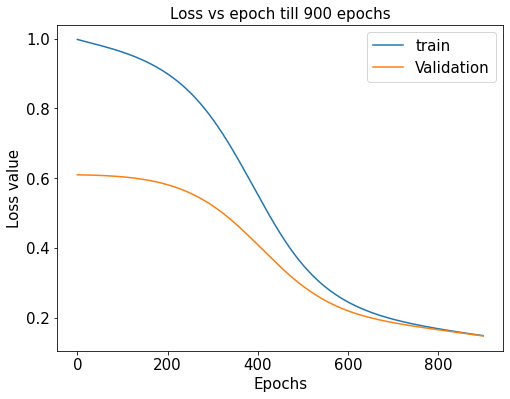

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(loss_train[:900], label='train')
plt.plot(loss_test[:900] , label='Validation')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Epochs',fontsize=15)
plt.ylabel('Loss value',fontsize=15)
plt.title('Loss vs epoch till 900 epochs',fontsize=15)
plt.legend(fontsize=15)

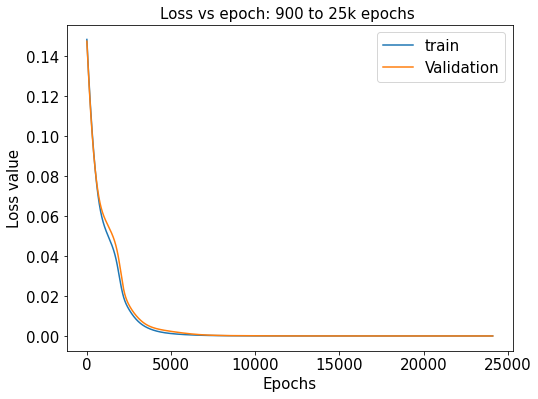

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(loss_train[900:], label='train')
plt.plot(loss_test[900:] , label='Validation')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Epochs',fontsize=15)
plt.ylabel('Loss value',fontsize=15)
plt.title('Loss vs epoch: 900 to 25k epochs ', fontsize=15)
plt.legend(fontsize=15)

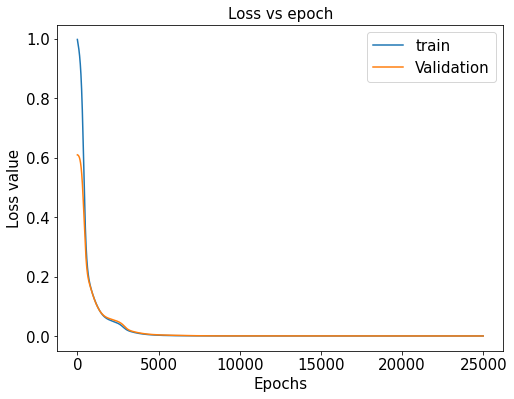

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(loss_train, label='train')
plt.plot(loss_test, label='Validation')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Epochs',fontsize=15)
plt.ylabel('Loss value',fontsize=15)
plt.title('Loss vs epoch', fontsize=15)
plt.legend(fontsize=15)

## Skip Save the model

In [ ]:
torch.save(model, 'TCL_LSTMmodel_with_Truestates_TANH2_25k.pth')

## Standardized Train plots 

In [169]:
x_train.shape

torch.Size([8000, 10, 4])

In [170]:

true = y_train.detach().cpu().numpy()


checktrain = x_train

p = model(checktrain)

p = p[0].cpu().detach().numpy()


error_train_temp1 = MSE(true[:,0],p[:,0])
error_train_temp2 = MSE(true[:,1],p[:,1])

print(error_train_temp1)
print(error_train_temp2)


RMSE_temp1 = np.sqrt(error_train_temp1)
RMSE_temp2 = np.sqrt(error_train_temp2)


print(RMSE_temp1)
print(RMSE_temp2)




1.1931862e-06
1.3512091e-06
0.0010923307
0.0011624153


Text(0.5, 1.0, 'Training Plot: Temperature 2 vs Time instant')

<Figure size 1800x1200 with 0 Axes>

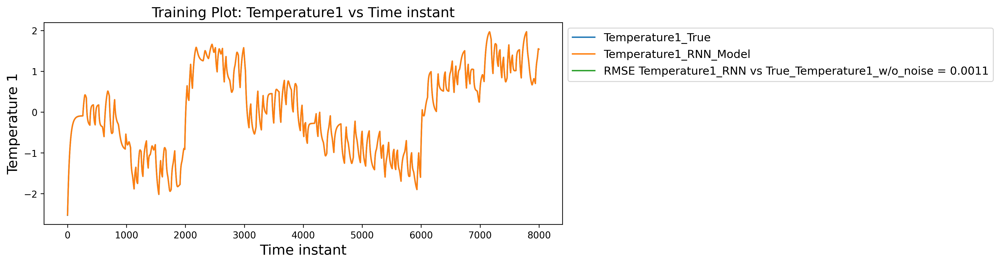

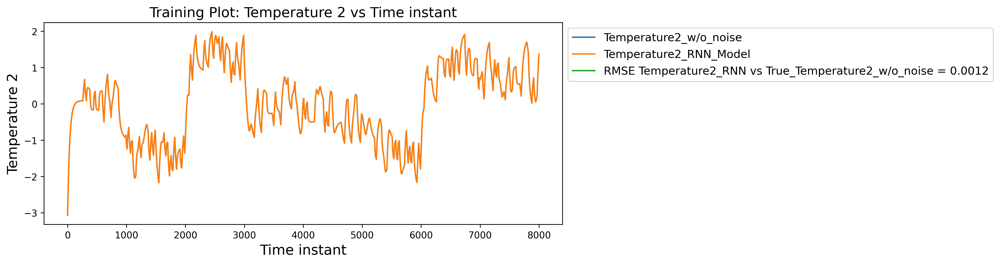

In [171]:
# x = 0.1*np.arange(0,len(checktrain[200:450,0]))
# plt.figure(1)
# plt.figure(figsize=(10,4))
# plt.plot(x,true[200:450,0], label='Temperature1_True')
# plt.plot(x, p[200:450,0], label='Temperature1_RNN_Model')
# plt.plot([], [], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_temp1))
# plt.xlabel('Time')
# plt.ylabel('Temperature 1')
# plt.legend(bbox_to_anchor=(1, 1),loc='upper left')
# plt.title('Training Plot: Temperature1 vs Time')

# plt.figure(2)
# plt.figure(figsize=(10,4))
# plt.plot(x,true[200:450,1], label='Temperature2_w/o_noise')
# plt.plot(x, p[200:450,1], label='Temperature2_RNN_Model')
# plt.plot([], [], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_temp2))
# plt.xlabel('Time')
# plt.ylabel('Temperature 2')
# plt.legend(bbox_to_anchor=(1, 1),loc='upper left')
# plt.title('Training Plot: Temperature 2 vs Time')



x = np.arange(0,len(checktrain[:,0]))
plt.figure(1)
plt.figure(figsize=(10,4))
plt.plot(x,true[:,0], label='Temperature1_True')
plt.plot(x, p[:,0], label='Temperature1_RNN_Model')
plt.plot([], [], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_temp1))
plt.xlabel('Time instant',fontsize=15)
plt.ylabel('Temperature 1',fontsize=15)
plt.legend(bbox_to_anchor=(1, 1),loc='upper left',fontsize=12)
plt.title('Training Plot: Temperature1 vs Time instant',fontsize=15)

plt.figure(2)
plt.figure(figsize=(10,4))
plt.plot(x,true[:,1], label='Temperature2_w/o_noise')
plt.plot(x, p[:,1], label='Temperature2_RNN_Model')
plt.plot([], [], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_temp2))
plt.xlabel('Time instant',fontsize=15)
plt.ylabel('Temperature 2',fontsize=15)
plt.legend(bbox_to_anchor=(1, 1),loc='upper left',fontsize=12)
plt.title('Training Plot: Temperature 2 vs Time instant',fontsize=15)


## Inverse Train Plots

In [172]:
#true = target[200:450]
true = y_train.detach().cpu().numpy()

true[:,0] = true[:,0]*std_output1 + mean_output1
true[:,1] = true[:,1]*std_output2 + mean_output2


# checktrain = torch.from_numpy(data[200:450].astype(np.float32))
# checktrain = checktrain.to(device)

checktrain = x_train

p = model(checktrain)
p = p[0].cpu().detach().numpy()

p[:,0] = p[:,0]*std_output1 + mean_output1
p[:,1] = p[:,1]*std_output2 + mean_output2

error_train_Temperature1 = MSE(true[:,0],p[:,0])
error_train_Temperature2 = MSE(true[:,1],p[:,1])


RMSE_temperature1 = np.sqrt(error_train_Temperature1)
RMSE_temperature2 = np.sqrt(error_train_Temperature2)


print(RMSE_temperature1)
print(RMSE_temperature2)


# print(np.sqrt(error_train_conc2))
# print(np.sqrt(error_train_temp2))

0.010693646
0.008871871


Text(0.5, 1.0, 'Training Plot: Temperature 2 vs Time instant')

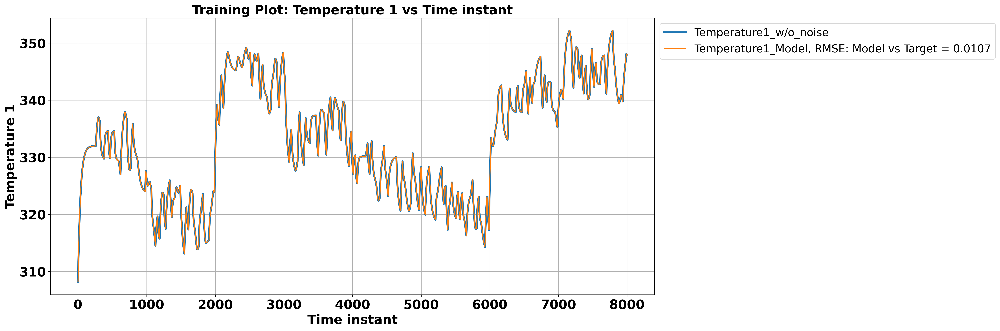

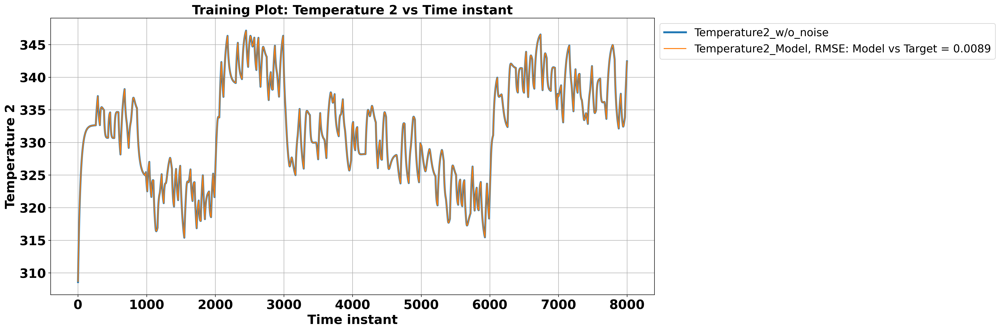

In [173]:
x = np.arange(0,len(checktrain[:8000,0]))
plt.figure(figsize=(17,8))
plt.plot(x,true[:8000,0], label='Temperature1_w/o_noise',linewidth=3)
plt.plot(x, p[:8000,0], label='Temperature1_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature1))
#plt.plot([], [], label='RMSE conc_model vs conc_w/o_noise = 0.198')
#plt.plot([], [], label='RMSE Height1_RNN vs True_height1_w/o_noise = {0:.4f}'.format(RMSE_height1))
#plt.plot([], [], label='RMSE conc_model vs True_conc_w/o_noise = 0.13065')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1),loc='upper left',fontsize=17)
plt.title('Training Plot: Temperature 1 vs Time instant',fontsize=20, fontweight='bold')

plt.figure(figsize=(17,8))
plt.plot(x,true[:8000,1], label='Temperature2_w/o_noise',linewidth=3)
plt.plot(x, p[:8000,1], label='Temperature2_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature2))
#plt.plot([], [], label='RMSE Temp_model vs Temp_w/o_noise = 0.136')
#plt.plot([], [], label='RMSE Temp_model vs True_Temp = 0.1617')
#plt.plot([], [], label='RMSE Height2_RNN vs True_height2_w/o_noise = {0:.4f}'.format(RMSE_height2))
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 2',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1),loc='upper left',fontsize=17)
plt.title('Training Plot: Temperature 2 vs Time instant',fontsize=20, fontweight='bold')




## VAlidation plots

In [174]:
validating_target = y_val.detach().cpu().numpy()



validating_predictions = []
i=0

while len(validating_predictions)<len(validating_target):

    input_ = x_val[i].view(1,T,4)    # convert the x_test[i] which is 2d to 3d
    p = model(input_)

    j= np.array(p[0].detach().cpu())

    validating_predictions.append(j)

    i+=1

validating_predictions = np.array(validating_predictions).reshape(-1,2)



# validating_predictions = np.asarray(validating_predictions)
print(validating_predictions.shape)
print(validating_target.shape)


error_train_height1 = MSE(validating_target[:,0],validating_predictions[:,0])
error_train_height2 = MSE(validating_target[:,1],validating_predictions[:,1])



RMSE_height1 = np.sqrt(error_train_height1)
RMSE_height2 = np.sqrt(error_train_height2)


print(RMSE_height1)
print(RMSE_height2)



(990, 2)
(990, 2)
0.0014237934
0.0023061526


Text(0.5, 1.0, 'Validation Plot: Temperature2 vs Time instant')

<Figure size 1800x1200 with 0 Axes>

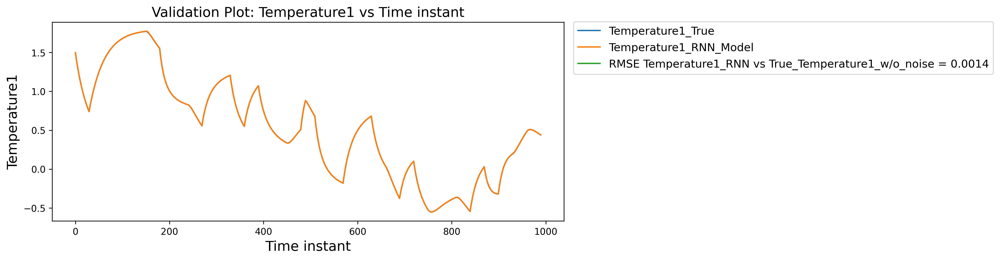

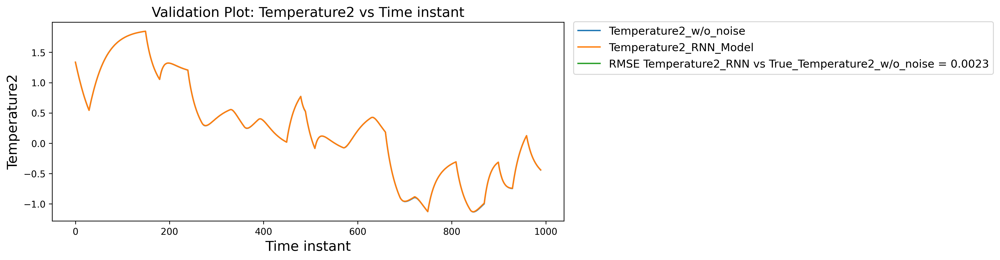

In [175]:
# x = 4*np.arange(0,len(validating_target[:187,0]))




# plt.figure(1)
# plt.figure(figsize=(10,4))
# plt.plot(x,validating_target[:187,0], label='Temperature1_True')
# plt.plot(x,validating_predictions[:187,0], label='Temperature1_RNN_Model')
# plt.plot([],[], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_height1))
# plt.xlabel('Time')
# plt.ylabel('Temperature1')
# plt.legend(bbox_to_anchor=(1.7, 0.71),loc = 'lower right')
# plt.title('Validation Plot: Temperature1 vs Time')

# plt.figure(2)
# plt.figure(figsize=(10,4))
# plt.plot(x,validating_target[:187,1], label='Temperature2_w/o_noise')
# plt.plot(x,validating_predictions[:187,1], label='Temperature2_RNN_Model')
# plt.plot([],[], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_height2))
# plt.xlabel('Time')
# plt.ylabel('Temperature2')
# plt.legend(bbox_to_anchor=(1.7, 0.71),loc = 'lower right')
# plt.title('Validation Plot: Temperature2 vs Time')


x = np.arange(0,len(validating_target[:,0]))




plt.figure(1)
plt.figure(figsize=(10,4))
plt.plot(x,validating_target[:,0], label='Temperature1_True')
plt.plot(x,validating_predictions[:,0], label='Temperature1_RNN_Model')
plt.plot([],[], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_height1))
plt.xlabel('Time instant',fontsize=15)
plt.ylabel('Temperature1',fontsize=15)
plt.legend(bbox_to_anchor=(1.85, 0.71),loc = 'lower right',fontsize=12)
plt.title('Validation Plot: Temperature1 vs Time instant',fontsize=15)

plt.figure(2)
plt.figure(figsize=(10,4))
plt.plot(x,validating_target[:,1], label='Temperature2_w/o_noise')
plt.plot(x,validating_predictions[:,1], label='Temperature2_RNN_Model')
plt.plot([],[], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_height2))
plt.xlabel('Time instant',fontsize=15)
plt.ylabel('Temperature2',fontsize=15)
plt.legend(bbox_to_anchor=(1.85, 0.71),loc = 'lower right',fontsize=12)
plt.title('Validation Plot: Temperature2 vs Time instant',fontsize=15)



## Inverse validation plots

In [176]:
validating_target = y_val.detach().cpu().numpy()


validating_target[:,0] = validating_target[:,0]*std_output1 + mean_output1
validating_target[:,1] = validating_target[:,1]*std_output2 + mean_output2



validating_predictions = []
i=0

while len(validating_predictions)<len(validating_target):

    input_ = x_val[i].view(1,T,4)    # convert the x_test[i] which is 2d to 3d
    p = model(input_)

    j= np.array(p[0].detach().cpu())

    validating_predictions.append(j)

    i+=1

validating_predictions = np.array(validating_predictions).reshape(-1,2)

validating_predictions[:,0] = validating_predictions[:,0]*std_output1 + mean_output1
validating_predictions[:,1] = validating_predictions[:,1]*std_output2 + mean_output2


# validating_predictions = np.asarray(validating_predictions)
print(validating_predictions.shape)
print(validating_target.shape)


error_train_temperature1 = MSE(validating_target[:,0],validating_predictions[:,0])
error_train_temperature2 = MSE(validating_target[:,1],validating_predictions[:,1])



RMSE_temperature1 = np.sqrt(error_train_temperature1)
RMSE_temperature2 = np.sqrt(error_train_temperature2)


print(RMSE_temperature1)
print(RMSE_temperature2)



(990, 2)
(990, 2)
0.013937891
0.017602058


Text(0.5, 1.0, 'Validation Plot: Temperature 2 vs Time instant')

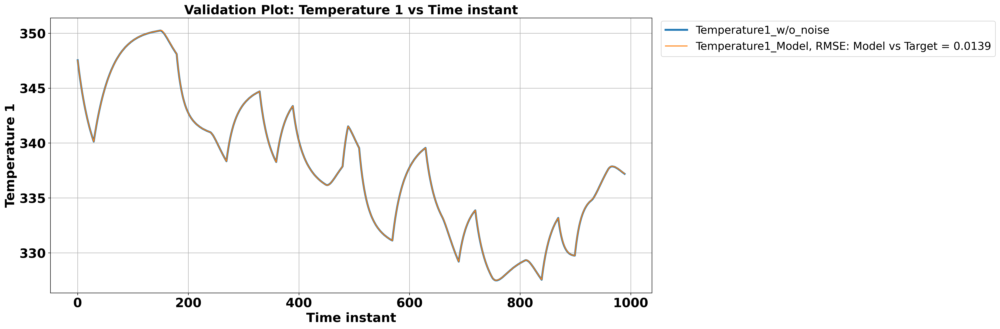

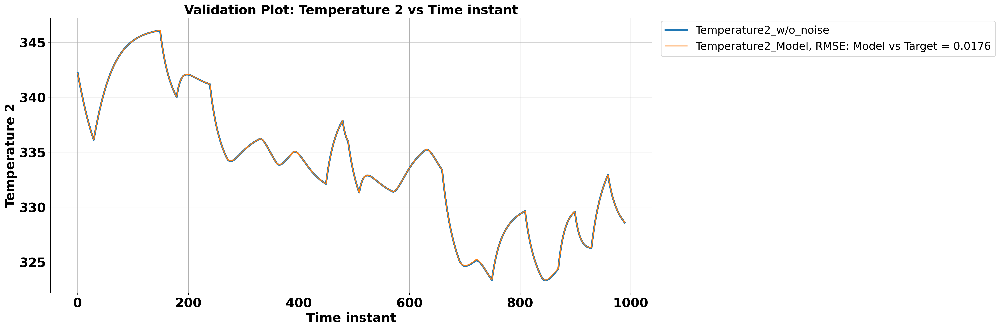

In [177]:


x = np.arange(0,len(validating_target[:,0]))

plt.figure(figsize=(17,8))
plt.plot(x,validating_target[:,0], label='Temperature1_w/o_noise',linewidth=3)
plt.plot(x,validating_predictions[:,0], label='Temperature1_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature1))
# plt.plot([],[], label='RMSE conc_model vs conc_w/o_noise = 0.00189')
# plt.plot([],[], label='RMSE conc_model vs True_conc = 0.003550')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1.58, 0.84),loc = 'lower right',fontsize=17)
plt.title('Validation Plot: Temperature 1 vs Time instant',fontsize=20, fontweight='bold')

plt.figure(figsize=(17,8))
plt.plot(x,validating_target[:,1], label='Temperature2_w/o_noise',linewidth=3)
plt.plot(x,validating_predictions[:,1],label='Temperature2_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature2))
# plt.plot([],[], label='RMSE Temp_model vs Temp_w/o_noise = 0.1310')
# plt.plot([],[], label='RMSE Temp_model vs True_Temp = 0.3382')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 2',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1.58, 0.84),loc = 'lower right',fontsize=17)
plt.title('Validation Plot: Temperature 2 vs Time instant',fontsize=20, fontweight='bold')



## Test plots

In [178]:
test_output = series_test_temp

n_input = 4
n_output = 2

inputtest, outputtest = Dataloader(series_test, test_output,T,n_input,n_output)

print(inputtest.shape,outputtest.shape)

print(type(inputtest))

inputtest = torch.from_numpy(inputtest.astype(np.float32))
print(type(inputtest))

inputtest = inputtest.to(device)



(990, 10, 4) (990, 2)
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


In [179]:
with torch.no_grad():
    testset_predictions = model(inputtest)

    testset_predictions = np.asarray(testset_predictions[0].cpu())
    
print(testset_predictions.shape)

error_train_height1 = MSE(outputtest[:,0],testset_predictions[:,0])
error_train_height2 = MSE(outputtest[:,1],testset_predictions[:,1])


RMSE_height1 = np.sqrt(error_train_height1)
RMSE_height2 = np.sqrt(error_train_height2)

print(RMSE_height1)
print(RMSE_height2)



(990, 2)
0.014612828489261626
0.016144710750837066


<Figure size 1800x1200 with 0 Axes>

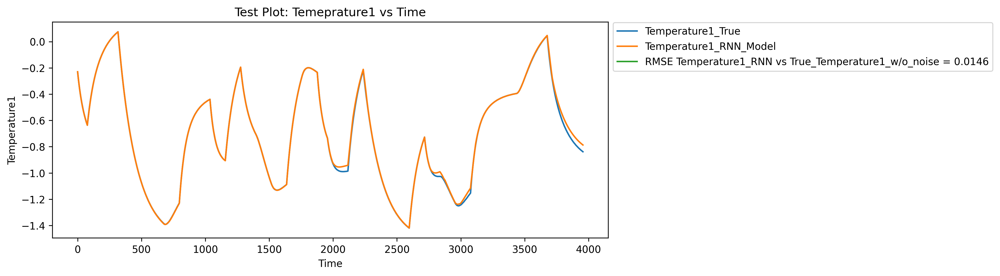

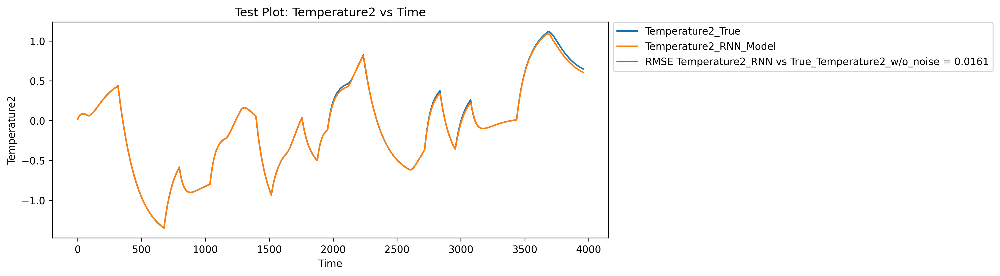

In [180]:
# x = 4*np.arange(0,len(testset_predictions[600:800,0]))


# plt.figure(1)
# plt.figure(figsize=(10,4))
# plt.plot(x,outputtest[600:800,0], label = 'Temperature1_True')
# plt.plot(x,testset_predictions[600:800,0],label='Temperature1_RNN_Model')
# plt.plot([],[], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_height1))
# plt.xlabel('Time')
# plt.ylabel('Temperature1')
# plt.title('Test Plot: Temeprature1 vs Time')
# plt.legend(bbox_to_anchor=(1, 1.02),loc='best')

# plt.figure(2)
# plt.figure(figsize=(10,4))
# plt.plot(x,outputtest[600:800,1], label = 'Temperature2_True')
# plt.plot(x,testset_predictions[600:800,1],label='Temperature2_RNN_Model')
# plt.plot([],[], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_height2))
# plt.xlabel('Time')
# plt.ylabel('Temperature2')
# plt.title('Test Plot: Temperature2 vs Time')
# plt.legend(bbox_to_anchor=(1, 1.02),loc='best')


x = 4*np.arange(0,len(testset_predictions[:,0]))


plt.figure(1)
plt.figure(figsize=(10,4))
plt.plot(x,outputtest[:,0], label = 'Temperature1_True')
plt.plot(x,testset_predictions[:,0],label='Temperature1_RNN_Model')
plt.plot([],[], label='RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_height1))
plt.xlabel('Time')
plt.ylabel('Temperature1')
plt.title('Test Plot: Temeprature1 vs Time')
plt.legend(bbox_to_anchor=(1, 1.02),loc='best')

plt.figure(2)
plt.figure(figsize=(10,4))
plt.plot(x,outputtest[:,1], label = 'Temperature2_True')
plt.plot(x,testset_predictions[:,1],label='Temperature2_RNN_Model')
plt.plot([],[], label='RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_height2))
plt.xlabel('Time')
plt.ylabel('Temperature2')
plt.title('Test Plot: Temperature2 vs Time')
plt.legend(bbox_to_anchor=(1, 1.02),loc='best')



## Inverse Test plots

In [181]:
test_output = series_test_temp

inputtest, outputtest = Dataloader(series_test, test_output,T,n_input,n_output)

print(inputtest.shape,outputtest.shape)

print(type(inputtest))

inputtest = torch.from_numpy(inputtest.astype(np.float32))
print(type(inputtest))

inputtest = inputtest.to(device)


(990, 10, 4) (990, 2)
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


In [182]:
with torch.no_grad():
    testset_predictions = model(inputtest)

    testset_predictions = np.asarray(testset_predictions[0].cpu())
    
print(testset_predictions.shape)


outputtest[:,0] = outputtest[:,0]*std_output1 + mean_output1
outputtest[:,1] = outputtest[:,1]*std_output2 + mean_output2


testset_predictions[:,0] = testset_predictions[:,0]*std_output1 + mean_output1
testset_predictions[:,1] = testset_predictions[:,1]*std_output2 + mean_output2


error_train_temperature1 = MSE(outputtest[:,0],testset_predictions[:,0])
error_train_temperature2 = MSE(outputtest[:,1],testset_predictions[:,1])


RMSE_temperature1 = np.sqrt(error_train_temperature1)
RMSE_temperature2 = np.sqrt(error_train_temperature2)


print(RMSE_temperature1)
print(RMSE_temperature2)


(990, 2)
0.14305407793795322
0.12322624749591517


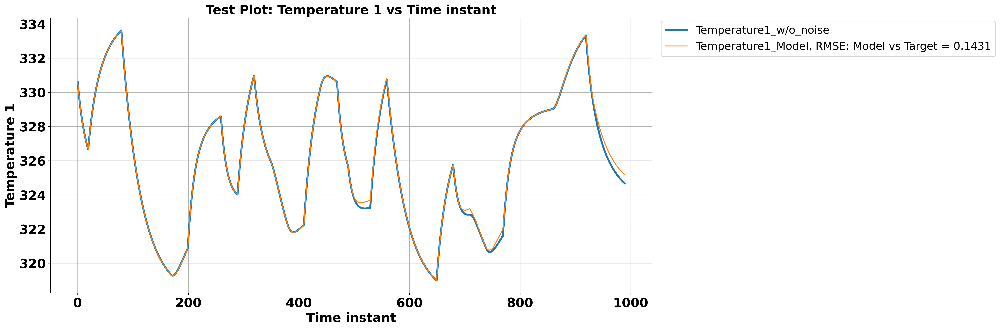

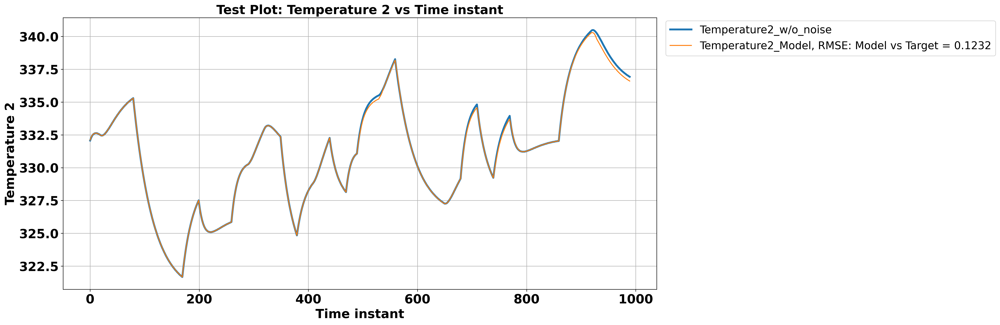

In [183]:
x = np.arange(0,len(testset_predictions[:,0]))

plt.figure(figsize=(17,8))
plt.plot(x,outputtest[:,0], label = 'Temperature1_w/o_noise',linewidth=3)
plt.plot(x,testset_predictions[:,0], label='Temperature1_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature1))
# plt.plot([],[], label='RMSE conc_model vs conc_w/o_noise = 0.001897')
# plt.plot([],[], label='RMSE conc_model vs True_conc = 0.003332')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.title('Test Plot: Temperature 1 vs Time instant',fontsize=20, fontweight='bold')
plt.legend(bbox_to_anchor=(1.58, 0.84),loc = 'lower right',fontsize=17)

plt.figure(figsize=(17,8))
plt.plot(x,outputtest[:,1], label = 'Temperature2_w/o_noise',linewidth=3)
plt.plot(x,testset_predictions[:,1],label='Temperature2_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_temperature2))
# plt.plot([],[], label='RMSE Temp_model vs Temp_w/o_noise = 0.1294')
# plt.plot([],[], label='RMSE Temp_model vs True_Temp = 0.3031')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 2',fontsize=20, fontweight='bold')
plt.xticks(fontsize=20, fontweight='bold')
plt.yticks(fontsize=20, fontweight='bold')
plt.grid()
plt.title('Test Plot: Temperature 2 vs Time instant',fontsize=20, fontweight='bold')
plt.legend(bbox_to_anchor=(1.58, 0.84),loc = 'lower right',fontsize=17)


## Multistep Prediction 

In [184]:

test_output = series_test_temp

inputtest, outputtest = Dataloader(series_test, test_output,T,n_input,n_output)

print(inputtest.shape,outputtest.shape)

print(type(inputtest))

inputtest = torch.from_numpy(inputtest.astype(np.float32))
print(type(inputtest))

inputtest = inputtest.to(device)

inputnew = inputtest
outputnew = outputtest

(990, 10, 4) (990, 2)
<class 'numpy.ndarray'>
<class 'torch.Tensor'>


In [185]:
last_x = inputnew[0].view(T,4) 

print(last_x[0].shape)

print(inputnew[1][0].shape)

print(outputnew[0])

torch.Size([4])
torch.Size([4])
[-0.23270365  0.01264067]


### Different multistep function

In [186]:
def multi(last_x,inputnew,p,step):

    if step ==1:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = inputnew[5]
        last_x[6] = inputnew[6]
        last_x[7] = inputnew[7]
        last_x[8] = inputnew[8]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = inputnew[9,2].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = inputnew[9,3].detach().item() # substituting Temp with predicted TEMP 2

    if step ==2:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = inputnew[5]
        last_x[6] = inputnew[6]
        last_x[7] = inputnew[7]
        last_x[8] = inputnew[8]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==3:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = inputnew[5]
        last_x[6] = inputnew[6]
        last_x[7] = inputnew[7]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==4:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = inputnew[5]
        last_x[6] = inputnew[6]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==5:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = inputnew[5]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==6:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = inputnew[4]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==7:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = inputnew[3]
        last_x[4] = last_x[5]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==8:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = inputnew[2]
        last_x[3] = last_x[4]
        last_x[4] = last_x[5]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==9:
        last_x[0] = inputnew[0]
        last_x[1] = inputnew[1]
        last_x[2] = last_x[3]
        last_x[3] = last_x[4]
        last_x[4] = last_x[5]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==10:
        last_x[0] = inputnew[0]
        last_x[1] = last_x[2]
        last_x[2] = last_x[3]
        last_x[3] = last_x[4]
        last_x[4] = last_x[5]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

    if step ==11:
        last_x[0] = last_x[1]
        last_x[1] = last_x[2]
        last_x[2] = last_x[3]
        last_x[3] = last_x[4]
        last_x[4] = last_x[5]
        last_x[5] = last_x[6]
        last_x[6] = last_x[7]
        last_x[7] = last_x[8]
        last_x[8] = last_x[9]

        last_x[9][0] = inputnew[9,0]
        last_x[9][1] = inputnew[9,1]

        # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2
    return last_x

In [187]:
validating_predictions_1 = []
validating_predictions_2 = []
validating_predictions_3 = []
validating_predictions_4 = []
validating_predictions_5 = []    
validating_predictions_6 = []
validating_predictions_7 = []
validating_predictions_8 = []
validating_predictions_9 = []
validating_predictions_10 = []
validating_predictions_11 = []

for step in [1,2,3,4,5,6,7,8,9,10,11]:

    print(step)
    print(type(step))
    #########################################################################
    test_output = series_test_temp

    inputtest, outputtest = Dataloader(series_test, test_output,T,n_input,n_output)


    inputtest = torch.from_numpy(inputtest.astype(np.float32))


    inputtest = inputtest.to(device)

    inputnew = inputtest
    outputnew = outputtest

    ##########################################################################





    last_x = inputnew[0].view(T,4)      ## CHANGE THE WINDOW SIZE FOR DIFFERENT SYSTEM
    i=0
    # while len(validating_predictions)<(len(outputnew)-1):
    while i<(len(outputnew)-1):
        i = i+1
        input_ = last_x.reshape(1,T,4)    # done as input needs 3 dimension (needs 1 as batch dimension too !!)
        p = model(input_)


        if step==1:
            validating_predictions_1.append(p[0].detach().cpu().numpy())

        elif step==2:
            validating_predictions_2.append(p[0].detach().cpu().numpy())

        elif step==3:
            validating_predictions_3.append(p[0].detach().cpu().numpy())    

        elif step==4:
            validating_predictions_4.append(p[0].detach().cpu().numpy())

        elif step==5:
            validating_predictions_5.append(p[0].detach().cpu().numpy())

        elif step==6:
            validating_predictions_6.append(p[0].detach().cpu().numpy())  

        elif step==7:
            validating_predictions_7.append(p[0].detach().cpu().numpy())     

        elif step==8:
            validating_predictions_8.append(p[0].detach().cpu().numpy())    

        elif step==9:
            validating_predictions_9.append(p[0].detach().cpu().numpy())

        elif step==10:
            validating_predictions_10.append(p[0].detach().cpu().numpy())

        else:
            validating_predictions_11.append(p[0].detach().cpu().numpy())  

                   
        #last_x = inputnew[i].view(T,6)

        # last_x[0] = last_x[1]
        # last_x[1] = last_x[2]
        # last_x[2] = last_x[3]
        # last_x[3] = last_x[4]
        # last_x[4] = last_x[5]
        # last_x[5] = last_x[6]
        # last_x[6] = last_x[7]
        # last_x[7] = last_x[8]
        # last_x[8] = last_x[9]

        # # last_x[9][2] = p[0,1].detach().item()      # substituting TEmp with predicted temp
        # # last_x[9][3] = (p[0,0].detach().item())/100 # substituting Temp with predicted conc
        # last_x[9][2] = p[0][0,0].detach().item()   # substituting TEmp with predicted temp
        # last_x[9][3] = p[0][0,1].detach().item() # substituting Temp with predicted TEMP 2

        last_x = multi(last_x,inputnew[i],p,step)

    if step==1:
        validating_predictions_1 = np.asarray(validating_predictions_1).reshape(-1,2)

    if step==2:
        validating_predictions_2 = np.asarray(validating_predictions_2).reshape(-1,2)

    if step==3:
        validating_predictions_3 = np.asarray(validating_predictions_3).reshape(-1,2)    

    if step==4:
        validating_predictions_4 = np.asarray(validating_predictions_4).reshape(-1,2)

    if step==5:
       validating_predictions_5 = np.asarray(validating_predictions_5).reshape(-1,2)

    if step==6:
        validating_predictions_6 = np.asarray(validating_predictions_6).reshape(-1,2) 

    if step==7:
        validating_predictions_7 = np.asarray(validating_predictions_7).reshape(-1,2)  

    if step==8:
        validating_predictions_8 = np.asarray(validating_predictions_8).reshape(-1,2)  

    if step==9:
        validating_predictions_9 = np.asarray(validating_predictions_9).reshape(-1,2)

    if step==10:
        validating_predictions_10 = np.asarray(validating_predictions_10).reshape(-1,2)

    if step==11:
        validating_predictions_11 = np.asarray(validating_predictions_11).reshape(-1,2)

    # validating_predictions = np.asarray(validating_predictions).reshape(-1,2)  ## CHANGE SHAPE WITH CHANGE IN SYSTEM

    ############# Destandardizing ######################

outputnew[:,0] = outputnew[:,0]*std_output1 + mean_output1
outputnew[:,1] = outputnew[:,1]*std_output2 + mean_output2

print(type(validating_predictions_1))
validating_predictions_1[:,0] = validating_predictions_1[:,0]*std_output1 + mean_output1
validating_predictions_1[:,1] = validating_predictions_1[:,1]*std_output2 + mean_output2

validating_predictions_2[:,0] = validating_predictions_2[:,0]*std_output1 + mean_output1
validating_predictions_2[:,1] = validating_predictions_2[:,1]*std_output2 + mean_output2

validating_predictions_3[:,0] = validating_predictions_3[:,0]*std_output1 + mean_output1
validating_predictions_3[:,1] = validating_predictions_3[:,1]*std_output2 + mean_output2

validating_predictions_4[:,0] = validating_predictions_4[:,0]*std_output1 + mean_output1
validating_predictions_4[:,1] = validating_predictions_4[:,1]*std_output2 + mean_output2

validating_predictions_5[:,0] = validating_predictions_5[:,0]*std_output1 + mean_output1
validating_predictions_5[:,1] = validating_predictions_5[:,1]*std_output2 + mean_output2

validating_predictions_6[:,0] = validating_predictions_6[:,0]*std_output1 + mean_output1
validating_predictions_6[:,1] = validating_predictions_6[:,1]*std_output2 + mean_output2

validating_predictions_7[:,0] = validating_predictions_7[:,0]*std_output1 + mean_output1
validating_predictions_7[:,1] = validating_predictions_7[:,1]*std_output2 + mean_output2

validating_predictions_8[:,0] = validating_predictions_8[:,0]*std_output1 + mean_output1
validating_predictions_8[:,1] = validating_predictions_8[:,1]*std_output2 + mean_output2

validating_predictions_9[:,0] = validating_predictions_9[:,0]*std_output1 + mean_output1
validating_predictions_9[:,1] = validating_predictions_9[:,1]*std_output2 + mean_output2

validating_predictions_10[:,0] = validating_predictions_10[:,0]*std_output1 + mean_output1
validating_predictions_10[:,1] = validating_predictions_10[:,1]*std_output2 + mean_output2

validating_predictions_11[:,0] = validating_predictions_11[:,0]*std_output1 + mean_output1
validating_predictions_11[:,1] = validating_predictions_11[:,1]*std_output2 + mean_output2





error_train_Temperature1_1 = MSE(outputnew[:989,0],validating_predictions_1[:,0])
error_train_Temperature2_1 = MSE(outputnew[:989,1],validating_predictions_1[:,1])


error_train_Temperature1_2 = MSE(outputnew[:989,0],validating_predictions_2[:,0])
error_train_Temperature2_2 = MSE(outputnew[:989,1],validating_predictions_2[:,1])


error_train_Temperature1_3 = MSE(outputnew[:989,0],validating_predictions_3[:,0])
error_train_Temperature2_3 = MSE(outputnew[:989,1],validating_predictions_3[:,1])


error_train_Temperature1_4 = MSE(outputnew[:989,0],validating_predictions_4[:,0])
error_train_Temperature2_4 = MSE(outputnew[:989,1],validating_predictions_4[:,1])

error_train_Temperature1_5 = MSE(outputnew[:989,0],validating_predictions_5[:,0])
error_train_Temperature2_5 = MSE(outputnew[:989,1],validating_predictions_5[:,1])


error_train_Temperature1_6 = MSE(outputnew[:989,0],validating_predictions_6[:,0])
error_train_Temperature2_6 = MSE(outputnew[:989,1],validating_predictions_6[:,1])

error_train_Temperature1_7 = MSE(outputnew[:989,0],validating_predictions_7[:,0])
error_train_Temperature2_7 = MSE(outputnew[:989,1],validating_predictions_7[:,1])

error_train_Temperature1_8 = MSE(outputnew[:989,0],validating_predictions_8[:,0])
error_train_Temperature2_8 = MSE(outputnew[:989,1],validating_predictions_8[:,1])


error_train_Temperature1_9 = MSE(outputnew[:989,0],validating_predictions_9[:,0])
error_train_Temperature2_9 = MSE(outputnew[:989,1],validating_predictions_9[:,1])


error_train_Temperature1_10 = MSE(outputnew[:989,0],validating_predictions_10[:,0])
error_train_Temperature2_10 = MSE(outputnew[:989,1],validating_predictions_10[:,1])

error_train_Temperature1_11 = MSE(outputnew[:989,0],validating_predictions_11[:,0])
error_train_Temperature2_11 = MSE(outputnew[:989,1],validating_predictions_11[:,1])




RMSE_Temperature1_1 = np.sqrt(error_train_Temperature1_1)
RMSE_Temperature2_1 = np.sqrt(error_train_Temperature2_1)


RMSE_Temperature1_2 = np.sqrt(error_train_Temperature1_2)
RMSE_Temperature2_2 = np.sqrt(error_train_Temperature2_2)

RMSE_Temperature1_3 = np.sqrt(error_train_Temperature1_3)
RMSE_Temperature2_3 = np.sqrt(error_train_Temperature2_3)


RMSE_Temperature1_4 = np.sqrt(error_train_Temperature1_4)
RMSE_Temperature2_4 = np.sqrt(error_train_Temperature2_4)

RMSE_Temperature1_5 = np.sqrt(error_train_Temperature1_5)
RMSE_Temperature2_5 = np.sqrt(error_train_Temperature2_5)


RMSE_Temperature1_6 = np.sqrt(error_train_Temperature1_6)
RMSE_Temperature2_6 = np.sqrt(error_train_Temperature2_6)

RMSE_Temperature1_7 = np.sqrt(error_train_Temperature1_7)
RMSE_Temperature2_7 = np.sqrt(error_train_Temperature2_7)


RMSE_Temperature1_8 = np.sqrt(error_train_Temperature1_8)
RMSE_Temperature2_8 = np.sqrt(error_train_Temperature2_8)

RMSE_Temperature1_9 = np.sqrt(error_train_Temperature1_9)
RMSE_Temperature2_9 = np.sqrt(error_train_Temperature2_9)


RMSE_Temperature1_10 = np.sqrt(error_train_Temperature1_10)
RMSE_Temperature2_10 = np.sqrt(error_train_Temperature2_10)

RMSE_Temperature1_11 = np.sqrt(error_train_Temperature1_11)
RMSE_Temperature2_11 = np.sqrt(error_train_Temperature2_11)




# for step in [1,2,3,4,5,6,7,8,9,10,11]:
#     print(f"RMSE for step: {step}")
#     print(f"{RMSE_Temperature1_{step}}")
#     print(RMSE_Temperature2)

#     print("\n")


1
<class 'int'>
2
<class 'int'>
3
<class 'int'>
4
<class 'int'>
5
<class 'int'>
6
<class 'int'>
7
<class 'int'>
8
<class 'int'>
9
<class 'int'>
10
<class 'int'>
11
<class 'int'>
<class 'numpy.ndarray'>


In [188]:
print(RMSE_Temperature1_1)
print(RMSE_Temperature2_1)

0.14222969217827194
0.12285359253819386


### Visualizations

<Figure size 1800x1200 with 0 Axes>

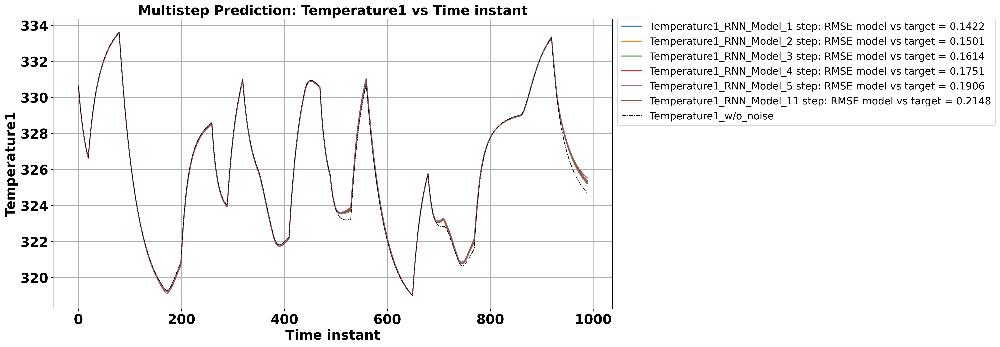

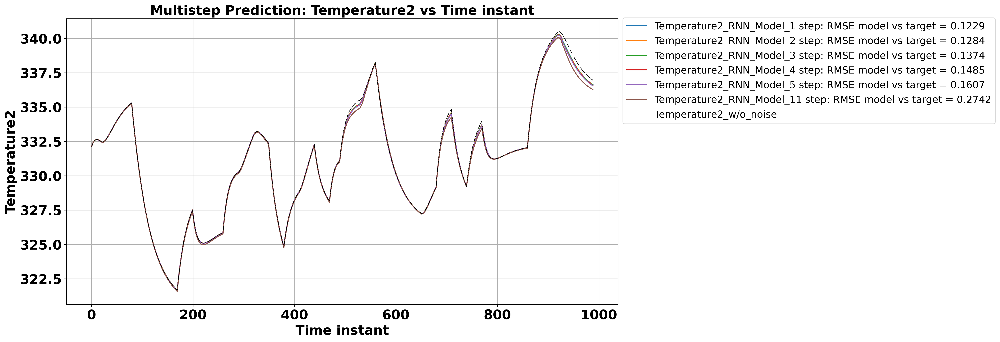

In [189]:


time = np.arange(0,len(validating_predictions_1[:,0]))



plt.figure(1)

time = np.arange(0,len(validating_predictions_1[:,0]))



plt.figure(1)
plt.figure(figsize=(15,8))
plt.plot(time,validating_predictions_1[:,0],label='Temperature1_RNN_Model_1 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_1))
plt.plot(time,validating_predictions_2[:,0],label='Temperature1_RNN_Model_2 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_2))
plt.plot(time,validating_predictions_3[:,0],label='Temperature1_RNN_Model_3 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_3))
plt.plot(time,validating_predictions_4[:,0],label='Temperature1_RNN_Model_4 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_4))
plt.plot(time,validating_predictions_5[:,0],label='Temperature1_RNN_Model_5 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_5))
plt.plot(time,validating_predictions_11[:,0],label='Temperature1_RNN_Model_11 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_11))
# plt.plot(time,validating_predictions_6[:,0],label='Temperature1_RNN_Model_6 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_6))
# plt.plot(time,validating_predictions_7[:,0],label='Temperature1_RNN_Model_7 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_7))
# plt.plot(time,validating_predictions_8[:,0],label='Temperature1_RNN_Model_8 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_8))
# plt.plot(time,validating_predictions_9[:,0],label='Temperature1_RNN_Model_9 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_9))
# plt.plot(time,validating_predictions_10[:,0],label='Temperature1_RNN_Model_10 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature1_10))
# plt.plot(time,validating_predictions_11[:,0],label='Temperature1_RNN_Model_multi step')


plt.plot(time,outputnew[:989,0], label = 'Temperature1_w/o_noise',linestyle='-.', linewidth=1,color='black')
#plt.plot([],[], label='Multistep Temperature1_RNN: RMSE Temperature1_RNN vs True_Temperature1_w/o_noise = {0:.4f}'.format(RMSE_Temperature1_11))
#plt.plot([],[], label = 'RMSE MSP: Conc_model vs Conc_True = 0.3708')
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature1',fontsize=20, fontweight='bold')
plt.title('Multistep Prediction: Temperature1 vs Time instant',fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=15)

plt.figure(2)
plt.figure(figsize=(15,8))
plt.plot(time,validating_predictions_1[:,1],label='Temperature2_RNN_Model_1 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_1))
plt.plot(time,validating_predictions_2[:,1],label='Temperature2_RNN_Model_2 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_2))
plt.plot(time,validating_predictions_3[:,1],label='Temperature2_RNN_Model_3 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_3))
plt.plot(time,validating_predictions_4[:,1],label='Temperature2_RNN_Model_4 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_4))
plt.plot(time,validating_predictions_5[:,1],label='Temperature2_RNN_Model_5 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_5))
plt.plot(time,validating_predictions_11[:,1],label='Temperature2_RNN_Model_11 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_11))
# plt.plot(time,validating_predictions_6[:,1],label='Temperature1_RNN_Model_6 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_6))
# plt.plot(time,validating_predictions_7[:,1],label='Temperature1_RNN_Model_7 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_7))
# plt.plot(time,validating_predictions_8[:,1],label='Temperature1_RNN_Model_8 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_8))
# plt.plot(time,validating_predictions_9[:,1],label='Temperature1_RNN_Model_9 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_9))
# plt.plot(time,validating_predictions_10[:,1],label='Temperature1_RNN_Model_10 step: RMSE model vs target = {0:.4f}'.format(RMSE_Temperature2_10))
# plt.plot(time,validating_predictions_11[:,1],label='Temperature1_RNN_Model_multi step')
plt.plot(time,outputnew[:989,1], label = 'Temperature2_w/o_noise',linestyle='-.',linewidth=1,color='black')
#plt.plot([],[], label='Multistep: RMSE Temperature2_RNN vs True_Temperature2_w/o_noise = {0:.4f}'.format(RMSE_Temperature2_11))
#plt.plot([],[], label = 'RMSE MSP: Temp_model vs Temp_True = 0.4604')
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature2',fontsize=20, fontweight='bold')
plt.title('Multistep Prediction: Temperature2 vs Time instant',fontsize=20, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=15)



## Step response


In [104]:


print(Input_step.shape)
print(output_step.shape)

inputtest_step, outputtest_step = Dataloader(Input_step, output_step,T,n_input,n_output)

print(inputtest_step.shape)
print(outputtest_step.shape)

(500, 4)
(500, 2)
(490, 10, 4)
(490, 2)


In [105]:
inputtest_step = torch.from_numpy(inputtest_step.astype(np.float32))
outputtest_step = torch.from_numpy(outputtest_step.astype(np.float32))


inputtest_step = inputtest_step.to(device)
# outputtest_step = outputtest_step.to(device)


In [106]:
with torch.no_grad():
    step_predictions = model(inputtest_step)

    step_predictions = np.asarray(step_predictions[0].cpu())
    
print(step_predictions.shape)



outputtest_step[:,0] = outputtest_step[:,0]*std_output1 + mean_output1
outputtest_step[:,1] = outputtest_step[:,1]*std_output2 + mean_output2


step_predictions[:,0] = step_predictions[:,0]*std_output1 + mean_output1
step_predictions[:,1] = step_predictions[:,1]*std_output2 + mean_output2

error_train_Temperature1 = MSE(outputtest_step[:,0],step_predictions[:,0])
error_train_Temperature2 = MSE(outputtest_step[:,1],step_predictions[:,1])


RMSE_Temperature1 = np.sqrt(error_train_Temperature1)
RMSE_Temperature2 = np.sqrt(error_train_Temperature2)

print(RMSE_Temperature1)
print(RMSE_Temperature2)


(490, 2)
0.090381406
0.1084619


In [107]:
Input_step.shape

(500, 4)

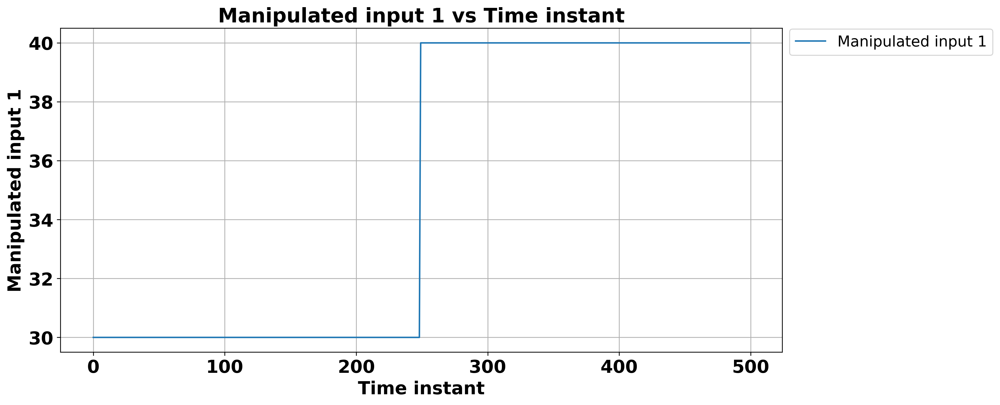

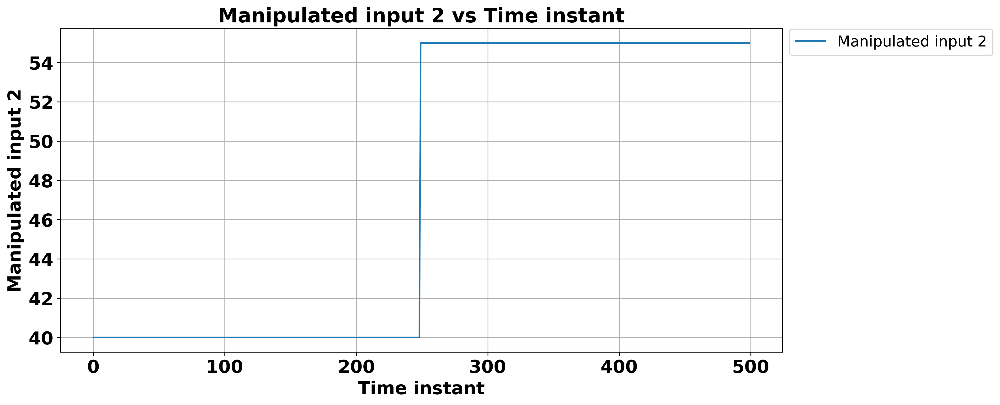

In [108]:
x =np.arange(0,500)


plt.figure(figsize=(13,6))
plt.plot(x,Input_step_plot[:,0], label = 'Manipulated input 1')
plt.title('Manipulated input 1 vs Time instant',fontsize=20, fontweight='bold')
plt.xticks(fontsize=18,rotation=0, fontweight='bold')
plt.yticks(fontsize=18,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=18, fontweight='bold')
plt.ylabel('Manipulated input 1',fontsize=18, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=15)

plt.figure(figsize=(13,6))
plt.plot(x,Input_step_plot[:,1], label = 'Manipulated input 2')
plt.title('Manipulated input 2 vs Time instant',fontsize=20, fontweight='bold')
plt.xticks(fontsize=18,rotation=0, fontweight='bold')
plt.yticks(fontsize=18,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=18, fontweight='bold')
plt.ylabel('Manipulated input 2',fontsize=18, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=15)




<Figure size 1800x1200 with 0 Axes>

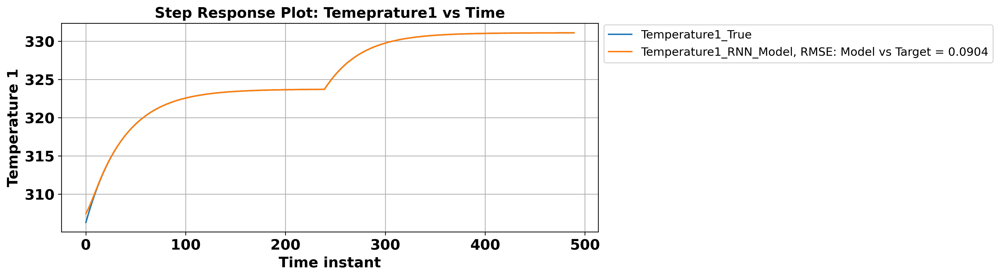

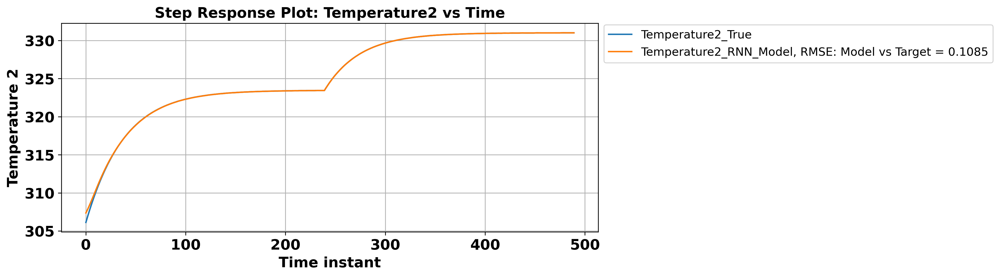

In [109]:

x = np.arange(0,len(step_predictions[:,0]))


plt.figure(1)
plt.figure(figsize=(10,4))
plt.plot(x,outputtest_step[:,0], label = 'Temperature1_True')
plt.plot(x,step_predictions[:,0],label='Temperature1_RNN_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_Temperature1))
plt.xticks(fontsize=15,rotation=0, fontweight='bold')
plt.yticks(fontsize=15,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=15, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=15, fontweight='bold')
plt.title('Step Response Plot: Temeprature1 vs Time',fontsize=15, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=12)

plt.figure(2)
plt.figure(figsize=(10,4))
plt.plot(x,outputtest_step[:,1], label = 'Temperature2_True')
plt.plot(x,step_predictions[:,1], label='Temperature2_RNN_Model, RMSE: Model vs Target = {0:.4f}'.format(RMSE_Temperature2))
plt.xticks(fontsize=15,rotation=0, fontweight='bold')
plt.yticks(fontsize=15,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=15, fontweight='bold')
plt.ylabel('Temperature 2',fontsize=15, fontweight='bold')
plt.title('Step Response Plot: Temperature2 vs Time',fontsize=15, fontweight='bold')
plt.grid()
plt.legend(bbox_to_anchor=(1, 1.02),loc='best',fontsize=12)

# plt.xticks(fontsize=20,rotation=0, fontweight='bold')
# plt.yticks(fontsize=20,rotation=0, fontweight='bold')
# plt.xlabel('Time instant',fontsize=20, fontweight='bold')
# plt.ylabel('Temperature2',fontsize=20, fontweight='bold')
# plt.title('Multistep Prediction: Temperature2 vs Time instant',fontsize=20, fontweight='bold')
# plt.grid()

## EKF

In [110]:


def EKF(x_est, x_pred, cov_est, yk,hidden1,hidden2,phi_test) :
    
    n_st =22
    n_op = 2
    n_ip=2

    #Q = 0.012**2
    # Q = np.diagflat([0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01])

    # R = np.diagflat([0.01,0.01])      ## Change if measurement noise changed

    Q = np.diagflat([0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.001028,0.00308])

    R = np.diagflat([0.0005114,0.00153])  


    C = np.zeros((2,22))        ## CHANGE WHEN SYSTEM CHANGE
    
    C[0][20] = 0.9971
    C[1][21] = 0.9983


    C = np.array(C)
    C = np.mat(C) 

    #x_est = x_est.reshape(n_st,1)
    x_pred = x_pred.reshape(n_st,1)
    yk = yk.reshape(n_op,1)
    # u = u.reshape(n_ip,1)
    # d= d.reshape(1,1)



    phi_EKF = phi_test



    # one line calc gammad

    C_lin = C
    
    cov_pred = np.dot(phi_EKF,np.dot(cov_est,phi_EKF.T)) + Q
    
    #cov_pred = np.dot(phi_EKF,np.dot(cov_est,phi_EKF.T)) + gamma_bd*Q*gamma_bd.T
    kgain = np.dot(C_lin,np.dot(cov_pred,C_lin.T)) + R
    inv_kgain = kgain.I
    K_gain = np.dot(cov_pred,np.dot(C_lin.T,inv_kgain))

    y_pred = np.dot(C_lin,x_pred)
    y_pred = y_pred.reshape(n_op,1)

    x_est = x_pred + np.dot(K_gain,(yk - y_pred))
    cov_est = cov_pred - np.dot(K_gain, np.dot(C_lin,cov_pred))
              
    return x_est, y_pred, cov_est, cov_pred, phi_EKF, C_lin




## PREDICTION USING EKF

### STANDARDIZE AND DESTANDARDIZE FUNCTIONS

In [120]:
def norm(x,mean1,mean2,std1,std2):
    x[0] = (x[0] - mean1)/std1
    x[1] = (x[1] - mean2)/std2


    return x


def denorm(x,mean1,mean2,std1,std2):
    x[0] = x[0]*std1 + mean1
    x[1] = x[1]*std2 + mean2

    return x

### DATALOADER

In [121]:
def Dataloader(seriesss,target,plant,T):
     
     data4 = []
     output = []
     d = []
     minput = []
     pmeasurement = []

     for i in range(len(seriesss)-T):
         x = seriesss[i:i+T]
         data4.append(x)

         y = target[i+T-1]
         output.append(y)

         v = plant[i+T-1]
         pmeasurement.append(v)


     data4 = np.asarray(data4)
     output = np.asarray(output)
     pmeasurement = np.asarray(pmeasurement)


     data4 = data4.reshape(-1,T,4)
     output = output.reshape(-1,2)         # change when output length changes
     pmeasurement = pmeasurement.reshape(-1,2)


     return data4,output,pmeasurement

## PREPARING DATA

In [122]:
#INPUTNEW IS ALREADY NORMALIZED AS ITS A TEST SET
#WHEREAS, OUTPUTNEW_NOISY & PLANT NEW IS NOT NORMALIZED AS THESE GENERATED LATER

inputnew,outputnew_noisy, plantnew = Dataloader(Input_EKF,states_with_noise,plant_measurement,T)

print('Input shape:', inputnew.shape, type(inputnew))
print('Output shape:', outputnew_noisy.shape, type(outputnew_noisy))
print('plant measurement shape:', plantnew.shape, type(plantnew))
print('\n')

print(inputnew.shape,outputnew_noisy.shape)
print('\nType of input data:',type(inputnew))

inputnew = torch.from_numpy(inputnew.astype(np.float32))
print('\nType of input data:',type(inputnew))
print('\nType of output data:',type(outputnew_noisy))

inputnew = inputnew.to(device)

Input shape: (1339, 10, 4) <class 'numpy.ndarray'>
Output shape: (1339, 2) <class 'numpy.ndarray'>
plant measurement shape: (1339, 2) <class 'numpy.ndarray'>


(1339, 10, 4) (1339, 2)

Type of input data: <class 'numpy.ndarray'>

Type of input data: <class 'torch.Tensor'>

Type of output data: <class 'numpy.ndarray'>


In [123]:
print(outputnew_noisy[1])
print(plantnew[1])

[307.902 307.392]
[307.216 306.728]


## Weight Initialization

In [124]:
## WEIGHTS AND BIAS FOR RNN
W_xh, W_hh1, b_xh, b_hh1, W_xh2, W_hh2, b_xh2, b_hh2 = model.rnn.parameters()

## WEIGHTS AND BIAS FOR OUTPUT LAYER
w, b = model.fc.parameters()

## Separating matrix of u and xy

W_manipulated_input = W_xh[:,:2]
W_states_input = W_xh[:,2:]


W_hidden2_xh1 = np.dot(W_xh2.cpu().detach().numpy(),W_hh1.cpu().detach().numpy())
W_hidden2_xy = np.dot(W_xh2.cpu().detach().numpy(),W_states_input.cpu().detach().numpy())
w_final_xh1 = np.dot(w.cpu().detach().numpy(),W_hidden2_xh1)
w_final_xh2 =  np.dot(w.cpu().detach().numpy(),W_hh2.cpu().detach().numpy())
w_final_xy = np.dot(w.cpu().detach().numpy(),W_hidden2_xy)


In [125]:
print(W_xh.shape,W_hh1.shape,W_xh2.shape,W_hh2.shape,w.shape)
print(b_xh.shape,b_hh1.shape,b_xh2.shape,b_hh2.shape,b.shape)

torch.Size([10, 4]) torch.Size([10, 10]) torch.Size([10, 10]) torch.Size([10, 10]) torch.Size([2, 10])
torch.Size([10]) torch.Size([10]) torch.Size([10]) torch.Size([10]) torch.Size([2])


## Implementing EKF and prediction together

### Mean and variance of normalized subspace

In [126]:

mean_plant1 = plant_measurement[:,0].mean()
mean_plant2 = plant_measurement[:,1].mean()

var_plant1 = plant_measurement[:,0].var()
var_plant2 = plant_measurement[:,1].var()

std_plant1 = plant_measurement[:,0].std()
std_plant2 = plant_measurement[:,1].std()


In [127]:
## Generating mean and variance of process noise states

mean_output1_EKF = states_with_noise[:,0].mean()
mean_output2_EKF = states_with_noise[:,1].mean()

std_output1_EKF = states_with_noise[:,0].std()
std_output2_EKF = states_with_noise[:,1].std()

print(mean_output1_EKF)
print(mean_output2_EKF)
print(std_output1_EKF)
print(std_output2_EKF)

print(mean_plant1)
print(mean_plant2)
print(std_plant1)
print(std_plant2)


print("\n",mean_output1_EKF)
print(mean_output2_EKF)

print(std_output1_EKF)
print(std_output2_EKF)

330.1350289103039
329.51853595255744
11.076401440056436
9.343083839025462
330.0895418828762
329.4972231282431
11.107679912028557
9.358428688753767

 330.1350289103039
329.51853595255744
11.076401440056436
9.343083839025462


## Made this cell to reduce time

In [128]:

validating_predictions = []

#x_est = [50,50,90,75,200,50,140,100,140,100,200,50,180,50,50,200,0.257,391.57]
#    NO NEED TO INITALIZE X(0|0) WITH 18 STATES AS X(0|0) IS REQUIRED FOR RNN AND IT ONLY REQUIRES CON(0|0) AND TEMP (0|0) 

# REST FOR EKF 1 STES ARE ADDED IN EKF FUNCTION SO AFTER 1ST ITERATION XEST(1|1) IS AUTOMATICALLY 18X18
x_est = [301, 301]

x_est = np.array(x_est)

############################## Normalizing the first input (with input mean and std) ############################

x_est = norm(x_est,mean_output1_EKF,mean_output2_EKF,std_output1_EKF,std_output2_EKF)




x_est_app = []

cov_est = np.diagflat([0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.0631,0.1346])

last_x = inputnew[0].view(T,4)

# By doing this we are starting with x_hat_intial values which is standard procedure used for estimator
last_x[9][2]=x_est[0]
last_x[9][3]=x_est[1]





k=0

model_pred_h1=[]
model_pred_h2=[]


hidden1_prev = np.zeros((10,1))

test_hidden = []

In [129]:


while len(validating_predictions)<(len(inputnew)-1):
#while len(validating_predictions)<10:

    yk = plantnew[k].copy()

    yk[0] = (yk[0] - mean_plant1)/std_plant1
    yk[1] = (yk[1] - mean_plant2)/std_plant2


    k = k+1

    #print('%%%%%%%%% iteration going %%%%%%%%%%% ', k)
    input_ = last_x.reshape(1,T,4)    # done as input needs 3 dimension (needs 1 as batch dimension too !!)
    p = model(input_)



#################################
    hidden1= p[1][0].cpu().detach().numpy()
    hidden2 = p[1][1].cpu().detach().numpy()
##################################



###################################################### Generating Phi matrix ######################################################

# GEnerating phi matrix inside as now differentiation of state equation will require hidden value at each instant

#################################### Generating sec derivative for phi ####################################


#This is for equation of xh1(k+1)

    test_f = np.arctanh(hidden1).reshape(10,1)
    test_cos = np.cosh(test_f)
    test_sec = 1/test_cos
    test1_sec_square = test_sec**2


    hidden1_prev = hidden1

    test_f_2 = np.arctanh(hidden2).reshape(10,1)
    test_cos_2 = np.cosh(test_f_2)
    test_sec_2 = 1/test_cos_2
    test2_sec_square = test_sec_2**2

    #print(test2_sec_square)

    phi_RNN = np.zeros((22,22))
    for i in range(22):
        for j in range(22):
            if i<10:
                if j<10:
                    phi_RNN[i,j]= test1_sec_square[i] * W_hh1[i,j].cpu().detach().numpy()
                elif 9<j<20:
                    phi_RNN[i,j] = 0
                else:
                    phi_RNN[i,j] = test1_sec_square[i] * W_states_input[i,j-20].cpu().detach().numpy()

            if 9<i<20:
                if j<10:
                    phi_RNN[i,j]= test2_sec_square[i-10] * test1_sec_square[i-10] * W_hidden2_xh1[i-10,j] 
                elif 9<j<20:
                    phi_RNN[i,j] = test2_sec_square[i-10] * W_hh2[i-10,j-10].cpu().detach().numpy()
                else:
                    phi_RNN[i,j] = test2_sec_square[i-10] * test1_sec_square[i-10] * W_hidden2_xy[i-10,j-20]

            if 19<i<22:
                if j<10:
                    phi_RNN[i,j]= test2_sec_square[i-20] * test1_sec_square[i-20] * w_final_xh1[i-20,j] 
                elif 9<j<20:
                    phi_RNN[i,j] = test2_sec_square[i-20] * w_final_xh2[i-20,j-10]
                else:
                    phi_RNN[i,j] = test2_sec_square[i-20] * test1_sec_square[i-20] * w_final_xy[i-20,j-20]   




    phi_test = phi_RNN





    test2=[]
    for item in hidden1[0]:
        test2.append(item)

    for item in hidden2[0]:
        test2.append(item)

    for item in p[0][0]:
        
        test2.append(item.cpu().detach().numpy())



    model_pred_h1.append(p[0][0,0])
    model_pred_h2.append(p[0][0,1])


    
    p_convert= np.array(test2)

    x_est, y_pred, cov_est, cov_pred, phi_EKF, C_lin  = EKF(x_est,p_convert,cov_est,yk,hidden1,hidden2,phi_test)  
 


    x_est = np.array(x_est)

    x_est_app.append(x_est.reshape(-1,22))

    cov_est = np.array(cov_est)

    dummy = torch.from_numpy(x_est.T.astype(np.float32))



    validating_predictions.append(p_convert)
    #last_x = inputnew[k].view(T,6)
    
    last_x[0] = last_x[1]
    last_x[1] = last_x[2]
    last_x[2] = last_x[3]
    last_x[3] = last_x[4]
    last_x[4] = last_x[5]
    last_x[5] = last_x[6]
    last_x[6] = last_x[7]
    last_x[7] = last_x[8]
    last_x[8] = last_x[9]

    print(k)

    last_x[9][0] = inputnew[k][9,0]
    last_x[9][1] = inputnew[k][9,1]

    last_x[9][2] = dummy[0,20]      # substituting Height1 with predicted Height1
    last_x[9][3] = dummy[0,21] # substituting Height2 with predicted Height2



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [130]:
testing= np.array(x_est_app)
testing = testing.reshape(-1,22)
print(testing.shape)

test_denorm=[]
for item in testing:
     test_denorm.append(denorm(item[20:],mean_output1_EKF,mean_output2_EKF,std_output1_EKF,std_output2_EKF))


(1338, 22)


In [131]:
#x_est_app2 = np.array(x_est_app)
x_est_app2 = np.array(test_denorm)
print(x_est_app2.shape)
model_pred_h1_array = np.array(model_pred_h1)
model_pred_h2_array = np.array(model_pred_h2)



##################### DEnormalising model prediction ###################

model_pred_h1_array = model_pred_h1_array*std_output1_EKF + mean_output1_EKF
model_pred_h2_array = model_pred_h2_array*std_output2_EKF + mean_output2_EKF


#########################################################################

validating_predictions2 = np.array(validating_predictions)
print('Shape of EKF prediction:',x_est_app2.shape)
print('Shape of model prediction:',validating_predictions2.shape)


x_est_app2 = x_est_app2.reshape(-1,2)
validating_predictions2 = validating_predictions2.reshape(-1,22)
print('Shape of EKF prediction reshape:',x_est_app2.shape)
print('Shape of model prediction reshape:',validating_predictions2.shape)
print('Shape of model prediction reshape:',model_pred_h1_array.shape)

(1338, 2)
Shape of EKF prediction: (1338, 2)
Shape of model prediction: (1338, 22)
Shape of EKF prediction reshape: (1338, 2)
Shape of model prediction reshape: (1338, 22)
Shape of model prediction reshape: (1338,)


### RMSE

In [132]:
time = 0.1*np.arange(0,len(x_est_app2[610:625,0]))

error_Height1_EKF = MSE(outputnew_noisy[:1338,0],x_est_app2[:1338,0])
error_Height2_EKF = MSE(outputnew_noisy[:1338,1],x_est_app2[:1338,1])

RMSE_height1 = np.sqrt(error_Height1_EKF)
RMSE_height2 = np.sqrt(error_Height2_EKF)





error_Height1_model = MSE(outputnew_noisy[:1338,0],model_pred_h1_array[:1338])

error_Height2_model = MSE(outputnew_noisy[:1338,1],model_pred_h2_array[:1338])


RMSE_height1_model = np.sqrt(error_Height1_model)
RMSE_height2_model = np.sqrt(error_Height2_model)


error_height1_EKFvsTrue = MSE(plantnew[:1338,0],x_est_app2[:1338,0])
error_height2_EKFvsTrue = MSE(plantnew[:1338,1],x_est_app2[:1338,1])

RMSE_height1_EKFvsTrue = np.sqrt(error_height1_EKFvsTrue)
RMSE_height2_EKFvsTrue = np.sqrt(error_height2_EKFvsTrue)


print('error_Height1_EKF',np.sqrt(error_Height1_EKF))
print('error_Height2_EKF',np.sqrt(error_Height2_EKF))


print('error_Height1_model',np.sqrt(error_Height1_model))
print('error_Height2_model',np.sqrt(error_Height2_model))


print('error_Temperature1_EKFvsTrue',RMSE_height1_EKFvsTrue)
print('error_Temperature2_EKFvsTrue',RMSE_height2_EKFvsTrue)


print('Error between physics and plant')
RMSE_1stprinci_Temp1 = np.sqrt(MSE(plantnew[:1338,0],outputnew_noisy[:1338,0]))
RMSE_1stprinci_Temp2 = np.sqrt(MSE(plantnew[:1338,1],outputnew_noisy[:1338,1]))

print(RMSE_1stprinci_Temp1)
print(RMSE_1stprinci_Temp2)

error_Height1_EKF 0.4017481158987925
error_Height2_EKF 0.6105429775213096
error_Height1_model 0.7393740759195209
error_Height2_model 0.7707811148302013
error_Temperature1_EKFvsTrue 0.07564519189708013
error_Temperature2_EKFvsTrue 0.0938661682327307
Error between physics and plant
0.4003369619571975
0.6760103018823912


Text(0.5, 1.0, 'Temperature2 vs Time instant')

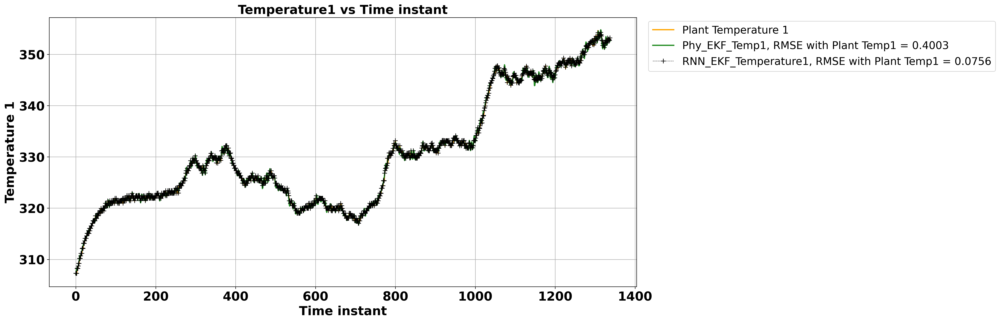

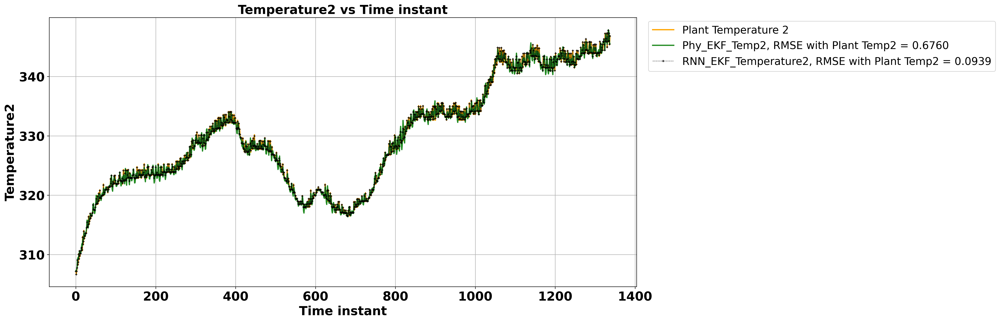

In [133]:
time = np.arange(0,len(x_est_app2[:,0]))

plt.figure(figsize=(17,8))


plt.plot(time,plantnew[:1338,0],label='Plant Temperature 1',c='orange',linewidth=2)
plt.plot(time,outputnew_noisy[:1338,0], label='Phy_EKF_Temp1, RMSE with Plant Temp1 = {0:.4f}'.format(RMSE_1stprinci_Temp1),c='forestgreen',linewidth=2)
plt.plot(time,x_est_app2[:1338,0],'k+--',label='RNN_EKF_Temperature1, RMSE with Plant Temp1 = {0:.4f}'.format(RMSE_height1_EKFvsTrue),linewidth=0.5,markersize=7.5)

plt.legend(bbox_to_anchor=(1.62, 0.78),loc='lower right',fontsize=17)
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=20, fontweight='bold')
plt.grid()
plt.title('Temperature1 vs Time instant',fontsize=20, fontweight='bold')


plt.figure(figsize=(17,8))
plt.plot(time,plantnew[:1338,1],label='Plant Temperature 2',c='orange',linewidth=2)
plt.plot(time,outputnew_noisy[:1338,1], label='Phy_EKF_Temp2, RMSE with Plant Temp2 = {0:.4f}'.format(RMSE_1stprinci_Temp2),c='forestgreen',linewidth=2)
plt.plot(time,x_est_app2[:1338,1],'k+--',label='RNN_EKF_Temperature2, RMSE with Plant Temp2 = {0:.4f}'.format(RMSE_height2_EKFvsTrue),linewidth=0.5,markersize=3.5)



plt.legend(bbox_to_anchor=(1.62, 0.78),loc='lower right',fontsize=17)
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature2',fontsize=20, fontweight='bold')
plt.grid()
plt.title('Temperature2 vs Time instant',fontsize=20, fontweight='bold')





# TAking single masurement

## Taking Y2 as measurement first

## EKF


In [134]:


def EKF(x_est, x_pred, cov_est, yk,hidden1,hidden2,phi_test) :
    
    n_st =22
    n_op = 1
    n_ip=2

    Q = np.diagflat([0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.001028,0.00308])

    R = np.diagflat([0.00153]) 


    C = np.zeros((1,22))        ## CHANGE WHEN SYSTEM CHANGE
    
    C[0][21] = 0.9983  

    C = np.array(C)
    C = np.mat(C) 

    x_pred = x_pred.reshape(n_st,1)
    yk = yk.reshape(n_op,1)

    phi_EKF = phi_test



    # one line calc gammad

    C_lin = C
    
    cov_pred = np.dot(phi_EKF,np.dot(cov_est,phi_EKF.T)) + Q
    kgain = np.dot(C_lin,np.dot(cov_pred,C_lin.T)) + R
    inv_kgain = kgain.I
    K_gain = np.dot(cov_pred,np.dot(C_lin.T,inv_kgain))

    y_pred = np.dot(C_lin,x_pred)
    y_pred = y_pred.reshape(n_op,1)

    x_est = x_pred + np.dot(K_gain,(yk - y_pred))
    cov_est = cov_pred - np.dot(K_gain, np.dot(C_lin,cov_pred))
              
    return x_est, y_pred, cov_est, cov_pred, phi_EKF, C_lin




## Prediction using EKF

### Standardization and destandardization Function

In [135]:
def norm(x,mean1,mean2,std1,std2):
    x[0] = (x[0] - mean1)/std1
    x[1] = (x[1] - mean2)/std2


    return x


def denorm(x,mean1,mean2,std1,std2):
    x[0] = x[0]*std1 + mean1
    x[1] = x[1]*std2 + mean2

    return x

### Dataloader

In [136]:
def Dataloader(seriesss,target,plant,T):
     
     data4 = []
     output = []
     d = []
     minput = []
     pmeasurement = []

     for i in range(len(seriesss)-T):
         x = seriesss[i:i+T]
         data4.append(x)

         y = target[i+T-1]
         output.append(y)

        #  z = disturbance1[i+T-1]
        #  d.append(z)

        #  w = mani_input[i+T-1]
        #  minput.append(w)

         v = plant[i+T-1]
         pmeasurement.append(v)


     data4 = np.asarray(data4)
     output = np.asarray(output)
    #  d = np.asarray(d)
    #  minput = np.asarray(minput)
     pmeasurement = np.asarray(pmeasurement)


     data4 = data4.reshape(-1,T,4)
     output = output.reshape(-1,2)         # change when output length changes
    #  d = d.reshape(-1,1)
    #  minput = minput.reshape(-1,2)
     pmeasurement = pmeasurement.reshape(-1,2) # Change when measurement changes


     return data4,output,pmeasurement

### Preparing Data

In [137]:
#INPUTNEW IS ALREADY NORMALIZED AS ITS A TEST SET
#WHEREAS, OUTPUTNEW_NOISY & PLANT NEW IS NOT NORMALIZED AS THESE GENERATED LATER

inputnew,outputnew_noisy, plantnew = Dataloader(Input_EKF_temp2as_measurement,states_with_noise_temp2as_measurement,plant_measurement,T)


# print('Disturbance shape:',disturbancenew.shape, type(disturbancenew))
# print('Manipulated input shape:',minputnew.shape, type(minputnew))
print('Input shape:', inputnew.shape, type(inputnew))
print('Output shape:', outputnew_noisy.shape, type(outputnew_noisy))
print('plant measurement shape:', plantnew.shape, type(plantnew))
print('\n')

print(inputnew.shape,outputnew_noisy.shape)
print('\nType of input data:',type(inputnew))

inputnew = torch.from_numpy(inputnew.astype(np.float32))
print('\nType of input data:',type(inputnew))
print('\nType of output data:',type(outputnew_noisy))

inputnew = inputnew.to(device)

Input shape: (1339, 10, 4) <class 'numpy.ndarray'>
Output shape: (1339, 2) <class 'numpy.ndarray'>
plant measurement shape: (1339, 2) <class 'numpy.ndarray'>


(1339, 10, 4) (1339, 2)

Type of input data: <class 'numpy.ndarray'>

Type of input data: <class 'torch.Tensor'>

Type of output data: <class 'numpy.ndarray'>


In [138]:
Input_EKF

array([[-0.69812609, -0.58596862, -2.54774799, -2.95389266],
       [-0.69812609, -0.58596862, -2.54413967, -2.91244685],
       [-0.69812609, -0.58596862, -2.56245188, -2.93626751],
       ...,
       [ 1.95624847,  1.92041797,  2.0178547 ,  1.72884194],
       [ 1.95624847,  1.92041797,  2.02759715,  1.71057588],
       [ 1.95624847,  1.92041797,  2.03715919,  1.69530075]])

In [139]:
plantnew

array([[307.216, 307.216],
       [307.216, 306.728],
       [307.216, 307.216],
       ...,
       [352.671, 345.34 ],
       [353.16 , 346.806],
       [352.671, 345.34 ]])

In [140]:
outputnew_noisy

array([[306.936, 307.396],
       [307.36 , 307.426],
       [307.757, 307.415],
       ...,
       [350.037, 345.65 ],
       [350.06 , 345.521],
       [350.072, 345.359]])

### Weight Initialization

In [141]:
## WEIGHTS AND BIAS FOR RNN
W_xh, W_hh1, b_xh, b_hh1, W_xh2, W_hh2, b_xh2, b_hh2 = model.rnn.parameters()

## WEIGHTS AND BIAS FOR OUTPUT LAYER
w, b = model.fc.parameters()

## Separating matrix of u and xy

W_manipulated_input = W_xh[:,:2]
W_states_input = W_xh[:,2:]


W_hidden2_xh1 = np.dot(W_xh2.cpu().detach().numpy(),W_hh1.cpu().detach().numpy())
W_hidden2_xy = np.dot(W_xh2.cpu().detach().numpy(),W_states_input.cpu().detach().numpy())
w_final_xh1 = np.dot(w.cpu().detach().numpy(),W_hidden2_xh1)
w_final_xh2 =  np.dot(w.cpu().detach().numpy(),W_hh2.cpu().detach().numpy())
w_final_xy = np.dot(w.cpu().detach().numpy(),W_hidden2_xy)


### Implementing EKF and predictions Together

#### Mean and variance for normalized subspace

In [144]:


mean_plant1 = plant_measurement[:,0].mean()
mean_plant2 = plant_measurement[:,1].mean()

var_plant1 = plant_measurement[:,0].var()
var_plant2 = plant_measurement[:,1].var()

std_plant1 = plant_measurement[:,0].std()
std_plant2 = plant_measurement[:,1].std()


In [145]:

mean_output1_EKF = states_with_noise[:,0].mean()
mean_output2_EKF = states_with_noise[:,1].mean()

std_output1_EKF = states_with_noise[:,0].std()
std_output2_EKF = states_with_noise[:,1].std()

print('For plant measurements')
print(mean_plant1)
print(mean_plant2)

print(std_plant1)
print(std_plant2)


print('\nFor states with noise')
print(mean_output1_EKF)
print(mean_output2_EKF)

print(std_output1_EKF)
print(std_output2_EKF)

For plant measurements
330.0895418828762
329.4972231282431
11.107679912028557
9.358428688753767

For states with noise
330.1350289103039
329.51853595255744
11.076401440056436
9.343083839025462


### Implementing (RMSE and visualization)

In [146]:


validating_predictions = []

#    NO NEED TO INITALIZE X(0|0) WITH 18 STATES AS X(0|0) IS REQUIRED FOR RNN AND IT ONLY REQUIRES CON(0|0) AND TEMP (0|0) 

# REST FOR EKF 1 STES ARE ADDED IN EKF FUNCTION SO AFTER 1ST ITERATION XEST(1|1) IS AUTOMATICALLY 18X18
x_est = [301, 301]

x_est = np.array(x_est)

############################## Normalizing the first input (with input mean and std) ############################

x_est = norm(x_est,mean_output1_EKF,mean_output2_EKF,std_output1_EKF,std_output2_EKF)




x_est_app = []

cov_est = np.diagflat([0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.0631,0.1346])

last_x = inputnew[0].view(T,4)

# By doing this we are starting with x_hat_intial values which is standard procedure used for estimator
last_x[9][2]=x_est[0]
last_x[9][3]=x_est[1]





k=0

model_pred_h1=[]
model_pred_h2=[]


hidden1_prev = np.zeros((10,1))

test_hidden = []

In [147]:


while len(validating_predictions)<(len(inputnew)-1):

    yk = plantnew[k,1].copy()

    yk = (yk - mean_plant2)/std_plant2          ## CHANGE WHEN Y CHANGES

    k = k+1

    #print('%%%%%%%%% iteration going %%%%%%%%%%% ', k)
    input_ = last_x.reshape(1,T,4)    # done as input needs 3 dimension (needs 1 as batch dimension too !!)
    p = model(input_)



#################################
    hidden1= p[1][0].cpu().detach().numpy()
    hidden2 = p[1][1].cpu().detach().numpy()
##################################



###################################################### Generating Phi matrix ######################################################

# GEnerating phi matrix inside as now differentiation of state equation will require hidden value at each instant

#################################### Generating sec derivative for phi ####################################


#This is for equation of xh1(k+1)

    test_f = np.arctanh(hidden1).reshape(10,1)
    test_cos = np.cosh(test_f)
    test_sec = 1/test_cos
    test1_sec_square = test_sec**2


    hidden1_prev = hidden1

    test_f_2 = np.arctanh(hidden2).reshape(10,1)
    test_cos_2 = np.cosh(test_f_2)
    test_sec_2 = 1/test_cos_2
    test2_sec_square = test_sec_2**2

    #print(test2_sec_square)

    phi_RNN = np.zeros((22,22))
    for i in range(22):
        for j in range(22):
            if i<10:
                if j<10:
                    phi_RNN[i,j]= test1_sec_square[i] * W_hh1[i,j].cpu().detach().numpy()
                elif 9<j<20:
                    phi_RNN[i,j] = 0
                else:
                    phi_RNN[i,j] = test1_sec_square[i] * W_states_input[i,j-20].cpu().detach().numpy()

            if 9<i<20:
                if j<10:
                    phi_RNN[i,j]= test2_sec_square[i-10] * test1_sec_square[i-10] * W_hidden2_xh1[i-10,j] 
                elif 9<j<20:
                    phi_RNN[i,j] = test2_sec_square[i-10] * W_hh2[i-10,j-10].cpu().detach().numpy()
                else:
                    phi_RNN[i,j] = test2_sec_square[i-10] * test1_sec_square[i-10] * W_hidden2_xy[i-10,j-20]

            if 19<i<22:
                if j<10:
                    phi_RNN[i,j]= test2_sec_square[i-20] * test1_sec_square[i-20] * w_final_xh1[i-20,j] 
                elif 9<j<20:
                    phi_RNN[i,j] = test2_sec_square[i-20] * w_final_xh2[i-20,j-10]
                else:
                    phi_RNN[i,j] = test2_sec_square[i-20] * test1_sec_square[i-20] * w_final_xy[i-20,j-20]   




    phi_test = phi_RNN





    test2=[]
    for item in hidden1[0]:
        test2.append(item)

    for item in hidden2[0]:
        test2.append(item)

    for item in p[0][0]:
        
        test2.append(item.cpu().detach().numpy())



    model_pred_h1.append(p[0][0,0])
    model_pred_h2.append(p[0][0,1])


    
    p_convert= np.array(test2)

    x_est, y_pred, cov_est, cov_pred, phi_EKF, C_lin  = EKF(x_est,p_convert,cov_est,yk,hidden1,hidden2,phi_test)  
 


    x_est = np.array(x_est)

    #x_est_app.append(x_est.reshape(-1,2))
    x_est_app.append(x_est.reshape(-1,22))

    cov_est = np.array(cov_est)

    dummy = torch.from_numpy(x_est.T.astype(np.float32))



    validating_predictions.append(p_convert)
    #last_x = inputnew[k].view(T,6)
    
    last_x[0] = last_x[1]
    last_x[1] = last_x[2]
    last_x[2] = last_x[3]
    last_x[3] = last_x[4]
    last_x[4] = last_x[5]
    last_x[5] = last_x[6]
    last_x[6] = last_x[7]
    last_x[7] = last_x[8]
    last_x[8] = last_x[9]

    print(k)
    last_x[9][0] = inputnew[k][9,0]
    last_x[9][1] = inputnew[k][9,1]

    last_x[9][2] = dummy[0,20]      # substituting Height1 with predicted Height1
    last_x[9][3] = dummy[0,21] # substituting Height2 with predicted Height2




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [148]:
testing= np.array(x_est_app)
testing = testing.reshape(-1,22)
print(testing.shape)

test_denorm=[]
for item in testing:
     test_denorm.append(denorm(item[20:],mean_output1_EKF,mean_output2_EKF,std_output1_EKF,std_output2_EKF))


(1338, 22)


In [149]:
#x_est_app2 = np.array(x_est_app)
x_est_app2 = np.array(test_denorm)
print(x_est_app2.shape)
model_pred_h1_array = np.array(model_pred_h1)
model_pred_h2_array = np.array(model_pred_h2)



##################### DEnormalising model prediction ###################

model_pred_h1_array = model_pred_h1_array*std_output1_EKF + mean_output1_EKF
model_pred_h2_array = model_pred_h2_array*std_output2_EKF + mean_output2_EKF


#########################################################################

validating_predictions2 = np.array(validating_predictions)
print('Shape of EKF prediction:',x_est_app2.shape)
print('Shape of model prediction:',validating_predictions2.shape)

# x_est_app2 = x_est_app2.reshape(-1,2)
# validating_predictions2 = validating_predictions2.reshape(-1,2)
# print('Shape of EKF prediction reshape:',x_est_app2.shape)
# print('Shape of model prediction reshape:',validating_predictions2.shape)

x_est_app2 = x_est_app2.reshape(-1,2)
validating_predictions2 = validating_predictions2.reshape(-1,22)
print('Shape of EKF prediction reshape:',x_est_app2.shape)
print('Shape of model prediction reshape:',validating_predictions2.shape)
print('Shape of model prediction reshape:',model_pred_h1_array.shape)

(1338, 2)
Shape of EKF prediction: (1338, 2)
Shape of model prediction: (1338, 22)
Shape of EKF prediction reshape: (1338, 2)
Shape of model prediction reshape: (1338, 22)
Shape of model prediction reshape: (1338,)


In [150]:

error_Height1_EKF = MSE(outputnew_noisy[:1338,0],x_est_app2[:1338,0])
error_Height2_EKF = MSE(outputnew_noisy[:1338,1],x_est_app2[:1338,1])

RMSE_height1 = np.sqrt(error_Height1_EKF)
RMSE_height2 = np.sqrt(error_Height2_EKF)





error_Height1_model = MSE(outputnew_noisy[:1338,0],model_pred_h1_array[:1338])

error_Height2_model = MSE(outputnew_noisy[:1338,1],model_pred_h2_array[:1338])


RMSE_height1_model = np.sqrt(error_Height1_model)
RMSE_height2_model = np.sqrt(error_Height2_model)


error_height1_EKFvsTrue = MSE(plantnew[:1338,0],x_est_app2[:1338,0])
error_height2_EKFvsTrue = MSE(plantnew[:1338,1],x_est_app2[:1338,1])

RMSE_height1_EKFvsTrue = np.sqrt(error_height1_EKFvsTrue)
RMSE_height2_EKFvsTrue = np.sqrt(error_height2_EKFvsTrue)


RMSE_1princi_Temp1 = np.sqrt(MSE(plantnew[:1338,0],outputnew_noisy[:1338,0]))
RMSE_1princi_Temp2 = np.sqrt(MSE(plantnew[:1338,1],outputnew_noisy[:1338,1]))

print('error_Height1_EKF',np.sqrt(error_Height1_EKF))
print('error_Height2_EKF',np.sqrt(error_Height2_EKF))


print('error_Height1_model',np.sqrt(error_Height1_model))
print('error_Height2_model',np.sqrt(error_Height2_model))


print('error_Temperature1_EKFvsTrue',RMSE_height1_EKFvsTrue)
print('error_Temperature2_EKFvsTrue',RMSE_height2_EKFvsTrue)

print('\nError with 1 principle')

print('error_Temperature1',RMSE_1princi_Temp1)
print('error_Temperature2',RMSE_1princi_Temp2)

error_Height1_EKF 1.3786565781492626
error_Height2_EKF 0.6330583859055449
error_Height1_model 1.1515927824537129
error_Height2_model 0.7625464891472601
error_Temperature1_EKFvsTrue 1.9443617409418803
error_Temperature2_EKFvsTrue 0.054724369903746684

Error with 1 principle
error_Temperature1 1.793585494063276
error_Temperature2 0.6713477314567603


Text(0.5, 1.0, 'Temperature2 vs Time instant')

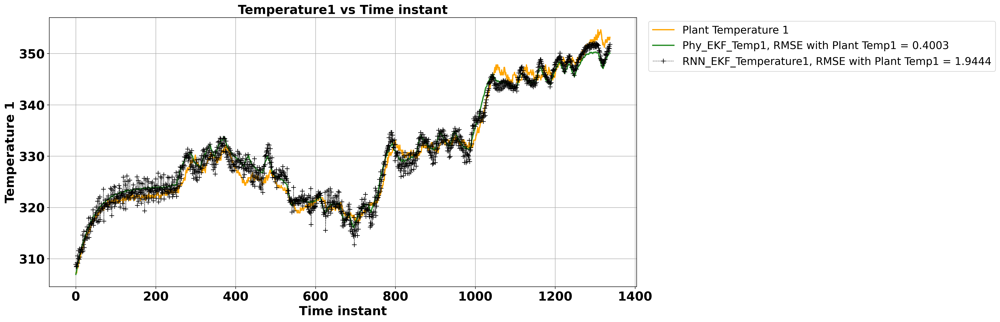

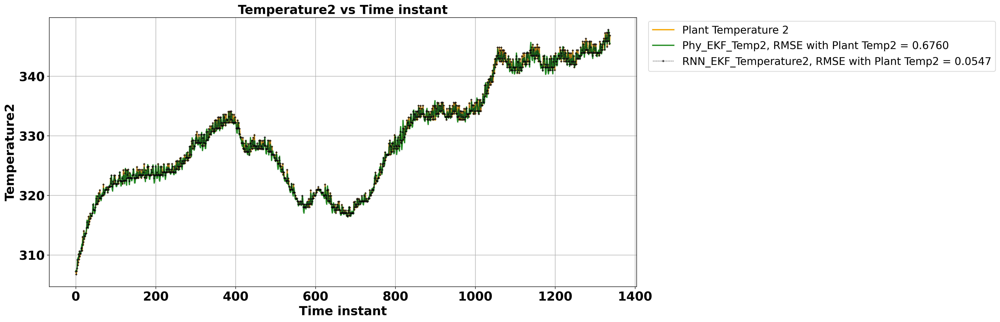

In [151]:
time = np.arange(0,len(x_est_app2[:,0]))

plt.figure(figsize=(17,8))

plt.plot(time,plantnew[:1338,0],label='Plant Temperature 1',c='orange',linewidth=2)
plt.plot(time,outputnew_noisy[:1338,0], label='Phy_EKF_Temp1, RMSE with Plant Temp1 = {0:.4f}'.format(RMSE_1stprinci_Temp1),c='forestgreen',linewidth=2)
plt.plot(time,x_est_app2[:1338,0],'k+--',label='RNN_EKF_Temperature1, RMSE with Plant Temp1 = {0:.4f}'.format(RMSE_height1_EKFvsTrue),linewidth=0.5,markersize=7.5)

plt.legend(bbox_to_anchor=(1.62, 0.78),loc='lower right',fontsize=17)
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature 1',fontsize=20, fontweight='bold')
plt.grid()
plt.title('Temperature1 vs Time instant',fontsize=20, fontweight='bold')


plt.figure(figsize=(17,8))
plt.plot(time,plantnew[:1338,1],label='Plant Temperature 2',c='orange',linewidth=2)
plt.plot(time,outputnew_noisy[:1338,1], label='Phy_EKF_Temp2, RMSE with Plant Temp2 = {0:.4f}'.format(RMSE_1stprinci_Temp2),c='forestgreen',linewidth=2)
plt.plot(time,x_est_app2[:1338,1],'k+--',label='RNN_EKF_Temperature2, RMSE with Plant Temp2 = {0:.4f}'.format(RMSE_height2_EKFvsTrue),linewidth=0.5,markersize=3.5)


plt.legend(bbox_to_anchor=(1.62, 0.78),loc='lower right',fontsize=17)
plt.xticks(fontsize=20,rotation=0, fontweight='bold')
plt.yticks(fontsize=20,rotation=0, fontweight='bold')
plt.xlabel('Time instant',fontsize=20, fontweight='bold')
plt.ylabel('Temperature2',fontsize=20, fontweight='bold')
plt.grid()
plt.title('Temperature2 vs Time instant',fontsize=20, fontweight='bold')



